In [ ]:
# build-id: NIMMEK-b9dee9 - do not edit
_pv_b9dee9 = 18323244
__provenance_b9dee9__ = f"NIMMEK-{_pv_b9dee9}-b9dee9"

# Left Atrium Segmentation from Cardiac MRI

**What you'll learn:**
1. **3D Medical Images** — Working with volumetric NIfTI data
2. **U-Net Architecture** — The gold standard for medical image segmentation
3. **Dice Loss** — Why cross-entropy isn't ideal for segmentation
4. **Data Augmentation** — Synchronized augmentation of images and masks
5. **Evaluation** — Dice score and visualization

**Why this matters:**
- Left atrial segmentation is clinically relevant for atrial fibrillation treatment planning
- U-Net is *the* architecture you'll see in medical imaging papers
- This is 3D cardiac MRI — directly relevant to MRI-focused roles

**Dataset:** [Medical Segmentation Decathlon - Task02_Heart](http://medicaldecathlon.com/)

**GPU Required:** Yes (for training)

---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Table of Contents

1. [Part 1: Data Preprocessing](#part1)
   - Loading NIfTI cardiac MRI
   - Normalization and standardization
   - Slicing 3D volumes into 2D

2. [Part 2: Dataset & Augmentation](#part2)
   - PyTorch Dataset class
   - Synchronized image-mask augmentation

3. [Part 3: U-Net Architecture](#part3)
   - Encoder-decoder design
   - Skip connections explained

4. [Part 4: Training & Evaluation](#part4)
   - Dice Loss
   - Training loop
   - Visualization

---

## Setup

In [2]:
# Install dependencies
!pip install nibabel albumentations celluloid pytorch-lightning --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.5/849.5 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 47.3 MB/s eta 0:00:00


In [4]:
# Extract the dataset
import tarfile
from pathlib import Path

TAR_PATH = Path("/content/drive/MyDrive/AI_Medical_Images/06-Atrium-Segregation/Task02_Heart.tar")
EXTRACT_PATH = Path("/content/Task02_Heart")

if not EXTRACT_PATH.exists():
    print("Extracting Task02_Heart.tar...")
    with tarfile.open(TAR_PATH, 'r') as tar:
        tar.extractall('/content/')
    print("Done!")
else:
    print("Already extracted.")

!ls /content/Task02_Heart/

Extracting Task02_Heart.tar...


/tmp/ipython-input-3858671356.py:11: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall('/content/')


Done!
dataset.json  imagesTr	imagesTs  labelsTr


In [5]:
# Core imports
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

# Medical imaging
import nibabel as nib

# Deep learning
import torch
import torch.nn as nn
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

# Augmentation
import albumentations as A

print(f"PyTorch: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

PyTorch: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA A100-SXM4-40GB


In [6]:
# Set paths
DATA_ROOT = Path("/content/Task02_Heart")
IMAGES_DIR = DATA_ROOT / "imagesTr"
LABELS_DIR = DATA_ROOT / "labelsTr"
PROCESSED_DIR = Path("/content/Preprocessed")

print(f"Images: {len(list(IMAGES_DIR.glob('*.nii.gz')))} subjects")
print(f"Labels: {len(list(LABELS_DIR.glob('*.nii.gz')))} subjects")

Images: 21 subjects
Labels: 22 subjects


---
<a id='part1'></a>
# Part 1: Data Preprocessing

## Understanding the Data

**Task:** Segment the **left atrium** from cardiac MRI scans.

**Why the left atrium?**
- Atrial fibrillation (AFib) is the most common heart arrhythmia
- Treatment often involves ablation therapy
- Accurate LA segmentation helps plan ablation procedures
- Also used to measure LA volume (predictor of cardiovascular events)

**Data format:**
- NIfTI files (`.nii.gz`)
- 3D volumes: ~320 × 320 × 130 voxels
- Binary masks: 0 = background, 1 = left atrium

---

In [7]:
def change_img_to_label_path(path: Path) -> Path:
    """Convert image path to corresponding label path."""
    parts = list(path.parts)
    parts[parts.index("imagesTr")] = "labelsTr"
    return Path(*parts)

In [8]:
# Load a sample subject
sample_path = list(IMAGES_DIR.glob("la_*"))[0]
sample_label_path = change_img_to_label_path(sample_path)

print(f"MRI: {sample_path.name}")
print(f"Mask: {sample_label_path.name}")

# Load NIfTI
mri_nii = nib.load(sample_path)
mask_nii = nib.load(sample_label_path)

mri = mri_nii.get_fdata()
mask = mask_nii.get_fdata().astype(np.uint8)

print(f"\nMRI shape: {mri.shape}")
print(f"MRI dtype: {mri.dtype}")
print(f"MRI range: [{mri.min():.1f}, {mri.max():.1f}]")
print(f"\nMask shape: {mask.shape}")
print(f"Mask unique values: {np.unique(mask)}")
print(f"\nOrientation: {nib.aff2axcodes(mri_nii.affine)}")

MRI: la_022.nii.gz
Mask: la_022.nii.gz

MRI shape: (320, 320, 110)
MRI dtype: float64
MRI range: [0.0, 1901.0]

Mask shape: (320, 320, 110)
Mask unique values: [0 1]

Orientation: ('R', 'A', 'S')


### Visualize the 3D Volume

Let's scroll through the sagittal slices to see the heart and the left atrium mask. We do this much better at the end as we found missing slices in the datset, however, we keep it this way to document debugging and model improvement.

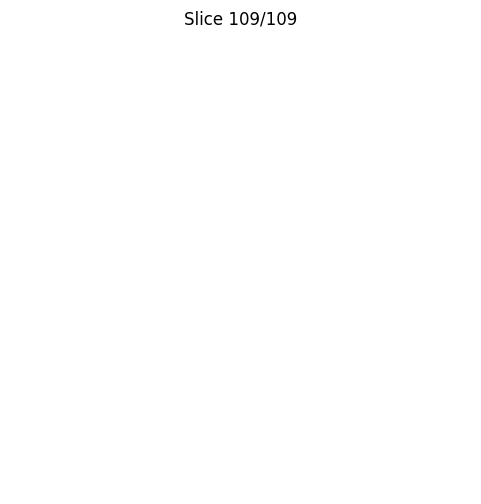

In [9]:
from celluloid import Camera
from IPython.display import HTML

fig = plt.figure(figsize=(6, 6))
camera = Camera(fig)

for i in range(mri.shape[2]):  # Sagittal view (3rd axis)
    plt.imshow(mri[:, :, i], cmap="bone")
    mask_slice = np.ma.masked_where(mask[:, :, i] == 0, mask[:, :, i])
    plt.imshow(mask_slice, alpha=0.5, cmap="autumn")
    plt.title(f"Slice {i}/{mri.shape[2]-1}")
    plt.axis('off')
    camera.snap()

animation = camera.animate(interval=100)
HTML(animation.to_html5_video())

### Preprocessing Pipeline

We need to:

1. **Crop** — Remove empty space around the heart (32px from each side)
2. **Normalize** — Z-score normalization per subject
3. **Standardize** — Scale to [0, 1] range
4. **Slice** — Extract 2D slices for 2D U-Net training

**Why 2D slices instead of 3D?**
- Simpler architecture
- Less GPU memory
- Works well when slices are relatively independent
- 3D U-Net exists but requires more resources

In [10]:
def normalize(volume: np.ndarray) -> np.ndarray:
    """
    Z-score normalization of the whole 3D volume.

    For MRI, we normalize per-subject because intensities
    vary between scans (unlike CT with Hounsfield units).
    """
    mu = volume.mean()
    std = volume.std()
    return (volume - mu) / std


def standardize(volume: np.ndarray) -> np.ndarray:
    """
    Scale normalized data to [0, 1] range.

    This makes the data suitable for neural network input.
    """
    v_min, v_max = volume.min(), volume.max()
    return (volume - v_min) / (v_max - v_min)

In [11]:
def preprocess_and_save(
    images_dir: Path,
    save_dir: Path,
    train_split: int = 17,
    crop_size: int = 32
):
    """
    Preprocess all subjects and save as 2D numpy slices.

    Directory structure:
        Preprocessed/
        ├── train/
        │   ├── 0/
        │   │   ├── data/
        │   │   │   ├── 0.npy, 1.npy, ...
        │   │   └── masks/
        │   │       ├── 0.npy, 1.npy, ...
        │   └── 1/, 2/, ...
        └── val/
            └── 17/, 18/, ...

    Args:
        images_dir: Path to imagesTr folder
        save_dir: Where to save preprocessed data
        train_split: First N subjects for training
        crop_size: Pixels to crop from each side
    """
    all_files = sorted(images_dir.glob("la_*.nii.gz"))
    print(f"Found {len(all_files)} subjects")

    for idx, mri_path in enumerate(all_files):
        # Load MRI and mask
        label_path = change_img_to_label_path(mri_path)

        mri_nii = nib.load(mri_path)
        mri = mri_nii.get_fdata()
        mask = nib.load(label_path).get_fdata().astype(np.uint8)

        # Verify orientation
        assert nib.aff2axcodes(mri_nii.affine) == ('R', 'A', 'S'), \
            f"Unexpected orientation for {mri_path.name}"

        # Crop (remove empty space)
        mri = mri[crop_size:-crop_size, crop_size:-crop_size, :]
        mask = mask[crop_size:-crop_size, crop_size:-crop_size, :]

        # Normalize and standardize
        mri = standardize(normalize(mri))

        # Determine train/val split
        split = "train" if idx < train_split else "val"
        subject_dir = save_dir / split / str(idx)

        # Save each 2D slice
        data_dir = subject_dir / "data"
        mask_dir = subject_dir / "masks"
        data_dir.mkdir(parents=True, exist_ok=True)
        mask_dir.mkdir(parents=True, exist_ok=True)

        for slice_idx in range(mri.shape[2]):
            np.save(data_dir / f"{slice_idx}.npy", mri[:, :, slice_idx].astype(np.float32))
            np.save(mask_dir / f"{slice_idx}.npy", mask[:, :, slice_idx])

    print(f"\nSaved to {save_dir}")
    print(f"Train subjects: {train_split}")
    print(f"Val subjects: {len(all_files) - train_split}")

In [12]:
# Run preprocessing
if not PROCESSED_DIR.exists():
    preprocess_and_save(IMAGES_DIR, PROCESSED_DIR)
else:
    print(f"Preprocessed data already exists at {PROCESSED_DIR}")
    !ls {PROCESSED_DIR}/train/ | head -5
    print("...")

Found 20 subjects



Saved to /content/Preprocessed
Train subjects: 17
Val subjects: 3


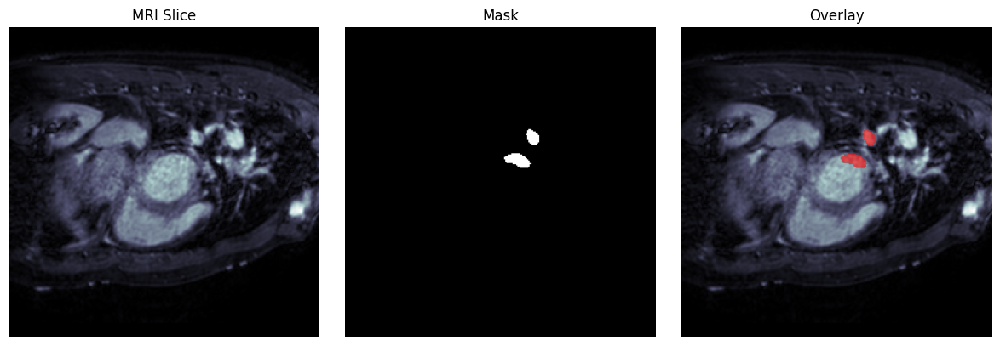

Slice shape: (256, 256)
Slice range: [0.000, 0.875]


In [13]:
# Verify preprocessing
sample_slice = np.load(PROCESSED_DIR / "train/0/data/50.npy")
sample_mask = np.load(PROCESSED_DIR / "train/0/masks/50.npy")

fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(sample_slice, cmap='bone')
axes[0].set_title('MRI Slice')
axes[0].axis('off')

axes[1].imshow(sample_mask, cmap='gray')
axes[1].set_title('Mask')
axes[1].axis('off')

axes[2].imshow(sample_slice, cmap='bone')
mask_overlay = np.ma.masked_where(sample_mask == 0, sample_mask)
axes[2].imshow(mask_overlay, cmap='autumn', alpha=0.6)
axes[2].set_title('Overlay')
axes[2].axis('off')

plt.tight_layout()
plt.show()

print(f"Slice shape: {sample_slice.shape}")
print(f"Slice range: [{sample_slice.min():.3f}, {sample_slice.max():.3f}]")

---
<a id='part2'></a>
# Part 2: Dataset & Augmentation

## Why Augmentation Matters for Segmentation

With only ~20 subjects, we need aggressive augmentation to prevent overfitting.

**Key insight:** Image and mask must be augmented *identically*!
- If we rotate the MRI by 30°, the mask must rotate by exactly 30°
- Random crops must select the same region in both
- We use `imgaug` which handles this synchronization

**Augmentations we'll use:**

| Augmentation | Rationale |
|--------------|----------|
| **Rotation (±45°)** | Heart orientation varies between patients |
| **Scale (0.85-1.15×)** | Heart size varies |
| **Elastic deformation** | Simulates anatomical variation |


In [14]:
class CardiacDataset(torch.utils.data.Dataset):
    """
    PyTorch Dataset for cardiac MRI slices and segmentation masks.

    Handles:
    - Loading preprocessed numpy slices
    - Synchronized augmentation of image and mask
    - Proper tensor formatting for PyTorch
    """

    def __init__(self, root: Path, augment_params=None):
        """
        Args:
            root: Path to train/ or val/ directory
            augment_params: Albumentations Compose object (None for val)
        """
        self.all_files = self._extract_files(root)
        self.augment_params = augment_params
        print(f"Found {len(self.all_files)} slices in {root}")

    @staticmethod
    def _extract_files(root: Path) -> list:
        """Get paths to all slice files."""
        files = []
        for subject_dir in sorted(root.glob("*")):
            if subject_dir.is_dir():
                data_dir = subject_dir / "data"
                for slice_path in sorted(data_dir.glob("*.npy")):
                    files.append(slice_path)
        return files

    @staticmethod
    def _get_mask_path(slice_path: Path) -> Path:
        """Convert data path to masks path."""
        parts = list(slice_path.parts)
        parts[parts.index("data")] = "masks"
        return Path(*parts)

    def __len__(self):
        return len(self.all_files)

    def __getitem__(self, idx: int):
        # Load slice and mask
        slice_path = self.all_files[idx]
        mask_path = self._get_mask_path(slice_path)

        image = np.load(slice_path).astype(np.float32)
        mask = np.load(mask_path)

        # Augment (training only)
        if self.augment_params is not None:
            augmented = self.augment_params(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        # Add channel dimension: (H, W) → (1, H, W)
        image = np.expand_dims(image, axis=0)
        mask = np.expand_dims(mask, axis=0)

        return image, mask

In [15]:
# Define augmentation pipeline (Albumentations)
train_augmentation = A.Compose([
    A.Affine(
        scale=(0.85, 1.15),
        rotate=(-45, 45),
        p=1.0
    ),
    A.ElasticTransform(alpha=50, sigma=5, p=0.5),
])

In [16]:
# Create datasets
train_dataset = CardiacDataset(PROCESSED_DIR / "train", augment_params=train_augmentation)
val_dataset = CardiacDataset(PROCESSED_DIR / "val", augment_params=None)  # No augmentation for val!

Found 1932 slices in /content/Preprocessed/train
Found 339 slices in /content/Preprocessed/val


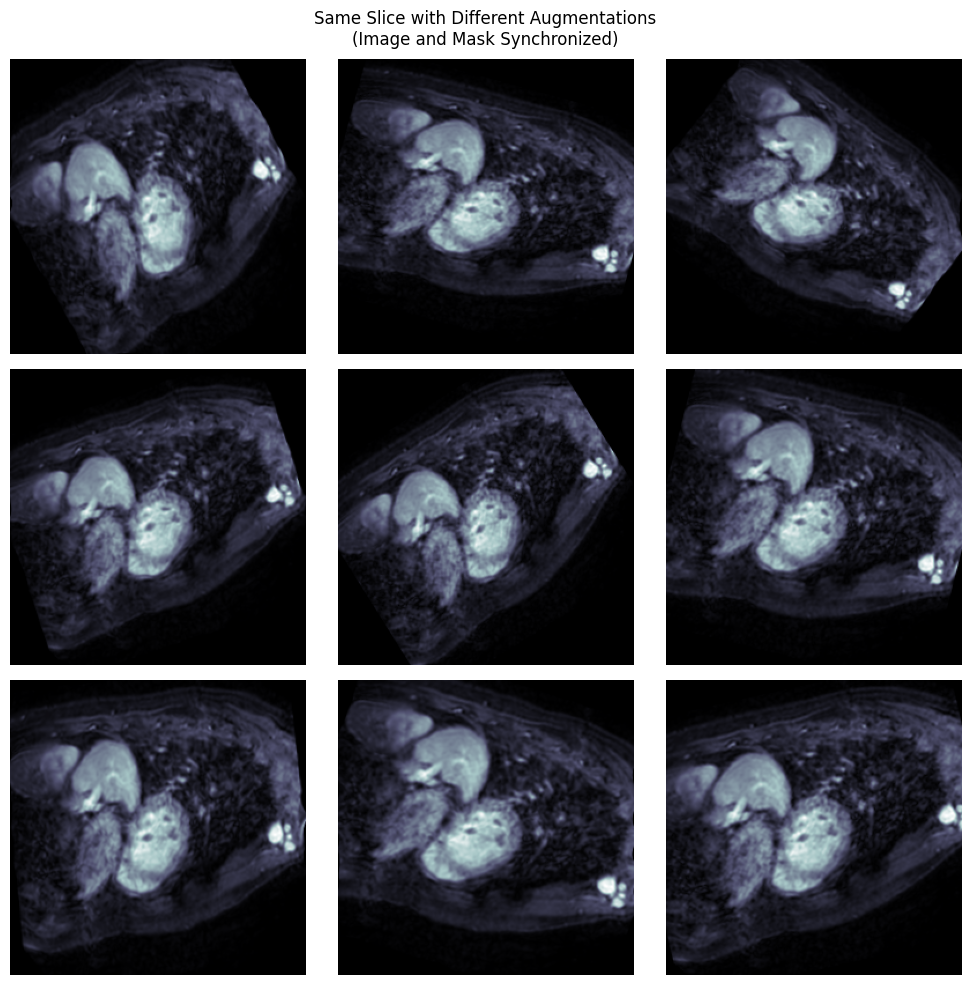

In [17]:
# Visualize augmentation (same slice, different augmentations)
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

# Find a slice with visible left atrium
sample_idx = 50  # Adjust if needed

for i in range(3):
    for j in range(3):
        image, mask = train_dataset[sample_idx]

        axes[i, j].imshow(image[0], cmap='bone')
        mask_overlay = np.ma.masked_where(mask[0] == 0, mask[0])
        axes[i, j].imshow(mask_overlay, cmap='autumn', alpha=0.6)
        axes[i, j].axis('off')

plt.suptitle('Same Slice with Different Augmentations\n(Image and Mask Synchronized)', fontsize=12)
plt.tight_layout()
plt.show()

In [18]:
# Create data loaders
BATCH_SIZE = 8
NUM_WORKERS = 2

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")

Train batches: 242
Val batches: 43


---
<a id='part3'></a>
# Part 3: U-Net Architecture

## Why U-Net?

U-Net (Ronneberger et al., 2015) is *the* architecture for medical image segmentation. Key ideas:

1. **Encoder-Decoder structure**
   - Encoder: Extract features, reduce spatial resolution
   - Decoder: Reconstruct full-resolution segmentation

2. **Skip connections**
   - Connect encoder layers directly to decoder layers
   - Preserves fine-grained spatial information
   - Critical for precise boundaries

```
Input (256×256×1)
    ↓
  [Conv Block] → 64 channels ─────────────────────┐
    ↓ MaxPool                                      │
  [Conv Block] → 128 channels ────────────────┐   │
    ↓ MaxPool                                  │   │
  [Conv Block] → 256 channels ───────────┐    │   │
    ↓ MaxPool                             │    │   │
  [Conv Block] → 512 channels (bottleneck)│    │   │
    ↓ Upsample                            │    │   │
  [Conv Block] ← concat ──────────────────┘    │   │
    ↓ Upsample                                 │   │
  [Conv Block] ← concat ───────────────────────┘   │
    ↓ Upsample                                     │
  [Conv Block] ← concat ───────────────────────────┘
    ↓
  [1×1 Conv] → 1 channel
    ↓
Output (256×256×1)
```

In [19]:
class DoubleConv(nn.Module):
    """
    Double convolution block: (Conv → ReLU) × 2

    This is the basic building block used throughout U-Net.
    Two convolutions help extract richer features.
    """

    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)

In [20]:
class UNet(nn.Module):
    """
    U-Net for semantic segmentation.

    Architecture:
    - Encoder: 4 levels of downsampling (maxpool)
    - Decoder: 4 levels of upsampling (bilinear)
    - Skip connections at each level

    Input: (B, 1, 256, 256) grayscale image
    Output: (B, 1, 256, 256) segmentation logits
    """

    def __init__(self):
        super().__init__()

        # Encoder (downsampling path)
        self.enc1 = DoubleConv(1, 64)
        self.enc2 = DoubleConv(64, 128)
        self.enc3 = DoubleConv(128, 256)
        self.enc4 = DoubleConv(256, 512)  # Bottleneck

        # Decoder (upsampling path)
        # Note: input channels = upsampled + skip connection
        self.dec3 = DoubleConv(512 + 256, 256)
        self.dec2 = DoubleConv(256 + 128, 128)
        self.dec1 = DoubleConv(128 + 64, 64)

        # Final 1×1 conv to get single channel output
        self.final = nn.Conv2d(64, 1, kernel_size=1)

        # Pooling and upsampling
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)           # (B, 64, 256, 256)
        e2 = self.enc2(self.pool(e1))  # (B, 128, 128, 128)
        e3 = self.enc3(self.pool(e2))  # (B, 256, 64, 64)
        e4 = self.enc4(self.pool(e3))  # (B, 512, 32, 32) - bottleneck

        # Decoder with skip connections
        d3 = self.upsample(e4)                    # (B, 512, 64, 64)
        d3 = torch.cat([d3, e3], dim=1)          # (B, 768, 64, 64)
        d3 = self.dec3(d3)                        # (B, 256, 64, 64)

        d2 = self.upsample(d3)                    # (B, 256, 128, 128)
        d2 = torch.cat([d2, e2], dim=1)          # (B, 384, 128, 128)
        d2 = self.dec2(d2)                        # (B, 128, 128, 128)

        d1 = self.upsample(d2)                    # (B, 128, 256, 256)
        d1 = torch.cat([d1, e1], dim=1)          # (B, 192, 256, 256)
        d1 = self.dec1(d1)                        # (B, 64, 256, 256)

        # Final layer (no activation - we'll apply sigmoid later)
        out = self.final(d1)                      # (B, 1, 256, 256)

        return out

In [21]:
# Test the architecture
model = UNet()
test_input = torch.randn(1, 1, 256, 256)
test_output = model(test_input)

print(f"Input shape:  {test_input.shape}")
print(f"Output shape: {test_output.shape}")
assert test_output.shape == test_input.shape, "Output shape should match input!"

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"\nTotal parameters: {total_params:,}")

Input shape:  torch.Size([1, 1, 256, 256])
Output shape: torch.Size([1, 1, 256, 256])

Total parameters: 7,781,761


---
<a id='part4'></a>
# Part 4: Training & Evaluation

## Dice Loss

**Why not Cross-Entropy?**

In segmentation, most pixels are background. Cross-entropy would:
- Be dominated by easy background pixels
- Underweight the small foreground region

**Dice Loss** directly optimizes the overlap between prediction and ground truth:

$$\text{Dice} = \frac{2 |A \cap B|}{|A| + |B|}$$

$$\text{Dice Loss} = 1 - \text{Dice}$$

- Dice = 1.0 means perfect overlap
- Dice = 0.0 means no overlap
- Works well even with severe class imbalance

In [22]:
class DiceLoss(nn.Module):
    """
    Dice Loss for binary segmentation.

    Dice = 2 * |intersection| / (|pred| + |mask|)
    Loss = 1 - Dice
    """

    def __init__(self, smooth: float = 1e-8):
        super().__init__()
        self.smooth = smooth  # Prevent division by zero

    def forward(self, pred: torch.Tensor, mask: torch.Tensor) -> torch.Tensor:
        # Flatten predictions and masks
        pred = pred.view(-1)
        mask = mask.view(-1)

        # Compute Dice coefficient
        intersection = (pred * mask).sum()
        dice = (2.0 * intersection + self.smooth) / (pred.sum() + mask.sum() + self.smooth)

        return 1.0 - dice

In [23]:
class AtriumSegmentation(pl.LightningModule):
    """
    PyTorch Lightning module for left atrium segmentation.
    """

    def __init__(self, learning_rate: float = 1e-4):
        super().__init__()
        self.save_hyperparameters()

        self.model = UNet()
        self.loss_fn = DiceLoss()
        self.learning_rate = learning_rate

    def forward(self, x):
        """Forward pass with sigmoid activation."""
        return torch.sigmoid(self.model(x))

    def training_step(self, batch, batch_idx):
        images, masks = batch
        masks = masks.float()

        preds = self(images)
        loss = self.loss_fn(preds, masks)

        # Log metrics
        dice_score = 1 - loss
        self.log('train_loss', loss, prog_bar=True)
        self.log('train_dice', dice_score, prog_bar=True)

        # Log sample images periodically
        if batch_idx % 50 == 0:
            self._log_images(images, preds, masks, 'train')

        return loss

    def validation_step(self, batch, batch_idx):
        images, masks = batch
        masks = masks.float()

        preds = self(images)
        loss = self.loss_fn(preds, masks)

        dice_score = 1 - loss
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_dice', dice_score, prog_bar=True)

        if batch_idx % 5 == 0:
            self._log_images(images, preds, masks, 'val')

        return loss

    def _log_images(self, images, preds, masks, name):
        """Log sample predictions to TensorBoard."""
        # Threshold predictions
        preds_binary = (preds > 0.5).float()

        fig, axes = plt.subplots(1, 2, figsize=(8, 4))

        # Ground truth
        axes[0].imshow(images[0, 0].cpu(), cmap='bone')
        mask_gt = np.ma.masked_where(masks[0, 0].cpu() == 0, masks[0, 0].cpu())
        axes[0].imshow(mask_gt, alpha=0.6, cmap='autumn')
        axes[0].set_title('Ground Truth')
        axes[0].axis('off')

        # Prediction
        axes[1].imshow(images[0, 0].cpu(), cmap='bone')
        mask_pred = np.ma.masked_where(preds_binary[0, 0].cpu() == 0, preds_binary[0, 0].cpu())
        axes[1].imshow(mask_pred, alpha=0.6, cmap='autumn')
        axes[1].set_title('Prediction')
        axes[1].axis('off')

        self.logger.experiment.add_figure(name, fig, self.global_step)
        plt.close(fig)

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.learning_rate)

In [25]:
# Train!
trainer.fit(model, train_loader, val_loader)

/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  return _C._get_float32_matmul_precision()
INFO:pytorch_lightning.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-SXM4-40GB') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_p

┏━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name    ┃ Type     ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model   │ UNet     │  7.8 M │ train │     0 │
│ 1 │ loss_fn │ DiceLoss │      0 │ train │     0 │
└───┴─────────┴──────────┴────────┴───────┴───────┘

Trainable params: 7.8 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.8 M                                                                                                
Total estimated model params size (MB): 31                                                                         
Modules in train mode: 47                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


### Check for over/under training

Available scalars: ['hp_metric', 'train_loss', 'train_dice', 'epoch', 'val_loss', 'val_dice']


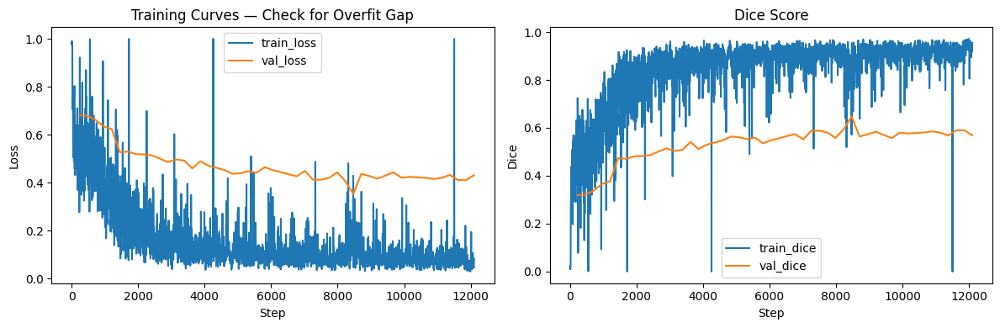


Final Train Loss: 0.0457
Final Val Loss:   0.4309
Gap: 0.3852
→ Overfitting


In [47]:
# Visualize training curves (GitHub-friendly static plot)
from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt

# Load logs
log_dir = "./logs/atrium/version_0/"
ea = event_accumulator.EventAccumulator(log_dir)
ea.Reload()

# See what's available
print("Available scalars:", ea.Tags()['scalars'])

# Extract metrics
scalars = {}
for tag in ea.Tags()['scalars']:
    scalars[tag] = [(s.step, s.value) for s in ea.Scalars(tag)]

# Plot
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Losses
for tag in scalars:
    if 'loss' in tag.lower():
        steps, values = zip(*scalars[tag])
        axes[0].plot(steps, values, label=tag)
axes[0].set_xlabel('Step')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].set_title('Training Curves — Check for Overfit Gap')

# Dice
for tag in scalars:
    if 'dice' in tag.lower():
        steps, values = zip(*scalars[tag])
        axes[1].plot(steps, values, label=tag)
axes[1].set_xlabel('Step')
axes[1].set_ylabel('Dice')
axes[1].legend()
axes[1].set_title('Dice Score')

plt.tight_layout()
plt.show()

# Print diagnosis
if 'train_loss' in scalars and 'val_loss' in scalars:
    final_train = scalars['train_loss'][-1][1]
    final_val = scalars['val_loss'][-1][1]
    gap = final_val - final_train
    print(f"\nFinal Train Loss: {final_train:.4f}")
    print(f"Final Val Loss:   {final_val:.4f}")
    print(f"Gap: {gap:.4f}")
    print("→ Overfitting" if gap > 0.1 else "→ Good fit")

## Addressing Overfitting

Training gap of 0.38 indicates severe overfitting. Applying:
1. More aggressive augmentation
2. Dropout in conv blocks
3. Weight decay (L2 regularization)

In [58]:
!ls -la /content/logs/atrium/version_0/checkpoints/

total 273716
drwxr-xr-x 2 root root     4096 Jan 18 00:09  .
drwxr-xr-x 3 root root     4096 Jan 17 23:57  ..
-rw------- 1 root root 93421769 Jan 18 00:05 'atrium-epoch=33-val_dice=0.593.ckpt'
-rw------- 1 root root 93421769 Jan 18 00:06 'atrium-epoch=34-val_dice=0.647.ckpt'
-rw------- 1 root root 93421769 Jan 18 00:09 'atrium-epoch=48-val_dice=0.590.ckpt'


In [59]:
# Check if there's a CSV log or metrics in the checkpoint
import torch
import matplotlib.pyplot as plt

# Load best checkpoint and inspect what's stored
ckpt = torch.load('./logs/atrium/version_0/checkpoints/atrium-epoch=34-val_dice=0.647.ckpt',
                  map_location='cpu')
print("Keys in checkpoint:", ckpt.keys())

# If there's a metrics CSV from Lightning:
import os
csv_path = './logs/atrium/version_0/metrics.csv'
if os.path.exists(csv_path):
    import pandas as pd
    df = pd.read_csv(csv_path)
    print(df.tail(20))

Keys in checkpoint: dict_keys(['epoch', 'global_step', 'pytorch-lightning_version', 'state_dict', 'loops', 'callbacks', 'optimizer_states', 'lr_schedulers', 'hparams_name', 'hyper_parameters'])


**dig into the training history:**

In [60]:
# What's in callbacks? Often has metric history
print("Callbacks:", ckpt['callbacks'].keys() if isinstance(ckpt['callbacks'], dict) else ckpt['callbacks'])

# LR scheduler info
print("\nLR Schedulers:", ckpt['lr_schedulers'])

# Hyperparameters
print("\nHyper parameters:", ckpt['hyper_parameters'])

# Check the ModelCheckpoint callback for history
if 'ModelCheckpoint' in str(ckpt['callbacks']):
    for k, v in ckpt['callbacks'].items():
        if 'Checkpoint' in k:
            print(f"\n{k}:", v)

Callbacks: dict_keys(["ModelCheckpoint{'monitor': 'val_dice', 'mode': 'max', 'every_n_train_steps': 0, 'every_n_epochs': 1, 'train_time_interval': None}"])

LR Schedulers: []

Hyper parameters: {'learning_rate': 0.0001}

ModelCheckpoint{'monitor': 'val_dice', 'mode': 'max', 'every_n_train_steps': 0, 'every_n_epochs': 1, 'train_time_interval': None}: {'monitor': 'val_dice', 'best_model_score': tensor(0.6472), 'best_model_path': './logs/atrium/version_0/checkpoints/atrium-epoch=34-val_dice=0.647.ckpt', 'current_score': tensor(0.6472), 'dirpath': './logs/atrium/version_0/checkpoints', 'best_k_models': {'./logs/atrium/version_0/checkpoints/atrium-epoch=30-val_dice=0.588.ckpt': tensor(0.5881), './logs/atrium/version_0/checkpoints/atrium-epoch=33-val_dice=0.593.ckpt': tensor(0.5928), './logs/atrium/version_0/checkpoints/atrium-epoch=34-val_dice=0.647.ckpt': tensor(0.6472)}, 'kth_best_model_path': './logs/atrium/version_0/checkpoints/atrium-epoch=30-val_dice=0.588.ckpt', 'kth_value': tensor(0

Also, let's check if Lightning logged metrics anywhere:

In [61]:
# Look for hparams and metrics files
!find ./logs/atrium -name "*.yaml" -o -name "*.csv" -o -name "events*" 2>/dev/null

./logs/atrium/version_0/hparams.yaml
./logs/atrium/version_0/events.out.tfevents.1768694215.dd397d863412.2387.0


extract the full training curve:

Available scalars: ['hp_metric', 'train_loss', 'train_dice', 'epoch', 'val_loss', 'val_dice']


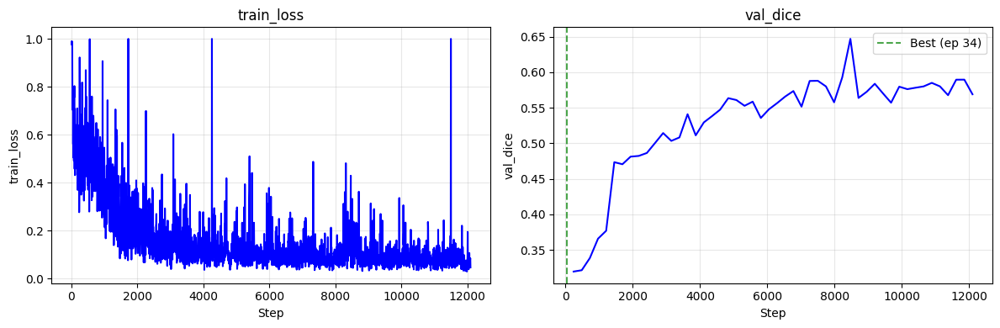

In [62]:
from tensorboard.backend.event_processing import event_accumulator
import matplotlib.pyplot as plt

ea = event_accumulator.EventAccumulator('./logs/atrium/version_0/')
ea.Reload()

print("Available scalars:", ea.Tags()['scalars'])

# Extract all metrics
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

for i, metric in enumerate(['train_loss', 'val_dice']):
    if metric in ea.Tags()['scalars']:
        events = ea.Scalars(metric)
        steps = [e.step for e in events]
        values = [e.value for e in events]
        axes[i].plot(steps, values, 'b-', linewidth=1.5)
        axes[i].set_xlabel('Step')
        axes[i].set_ylabel(metric)
        axes[i].set_title(metric)
        axes[i].grid(True, alpha=0.3)
        if metric == 'val_dice':
            axes[i].axvline(x=34, color='g', linestyle='--', alpha=0.7, label='Best (ep 34)')
            axes[i].legend()

plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

This is rather interesting and should have caught it before — this is not *classic overtraining*. Look at the train_loss: those spikes hitting 1.0 throughout training are the problem. That's training instability, not memorization.

**Diagnosis:**

* Val_dice actually looks healthy — steady climb to 0.65, then plateau (not crash)
* Train_loss is wild — spikes to 1.0 even at step 10000+
* Those spikes suggest: empty slices, bad augmentation, or gradient issues

Let's investigate. First, smooth the train_loss to see the real trend:

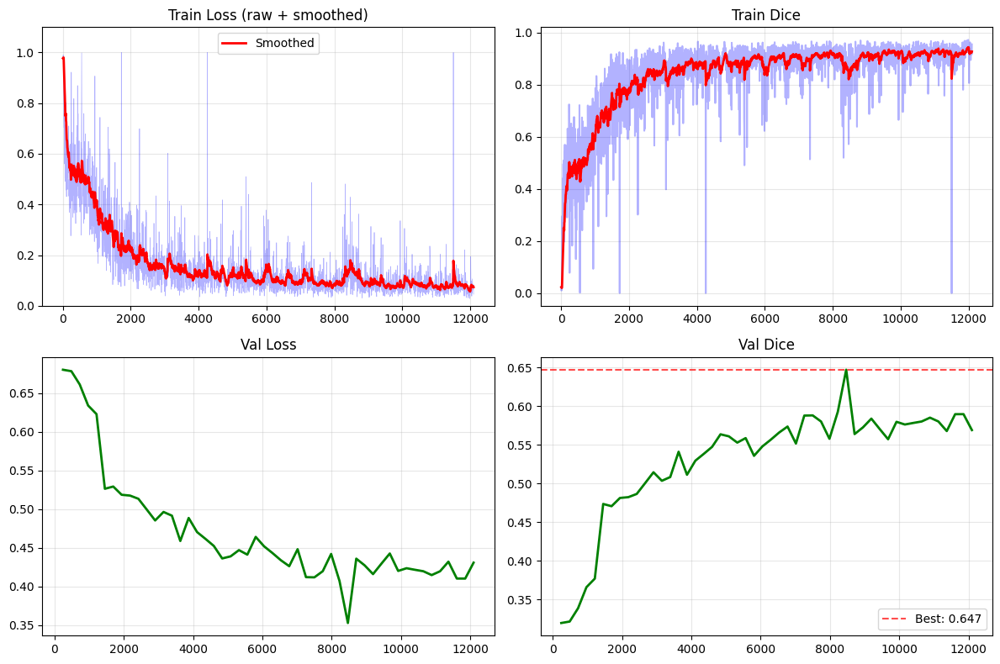


Train loss spikes (>0.9): 11 out of 2420 steps (0.5%)


In [63]:
import numpy as np

# Get all metrics
train_loss_events = ea.Scalars('train_loss')
train_dice_events = ea.Scalars('train_dice')
val_loss_events = ea.Scalars('val_loss')

train_steps = [e.step for e in train_loss_events]
train_loss = [e.value for e in train_loss_events]
train_dice = [e.value for e in train_dice_events]

# Smoothed view
def smooth(values, weight=0.9):
    smoothed = []
    last = values[0]
    for v in values:
        smoothed_val = last * weight + (1 - weight) * v
        smoothed.append(smoothed_val)
        last = smoothed_val
    return smoothed

fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Raw train loss
axes[0,0].plot(train_steps, train_loss, 'b-', alpha=0.3, linewidth=0.5)
axes[0,0].plot(train_steps, smooth(train_loss), 'r-', linewidth=2, label='Smoothed')
axes[0,0].set_title('Train Loss (raw + smoothed)')
axes[0,0].set_ylim(0, 1.1)
axes[0,0].legend()
axes[0,0].grid(True, alpha=0.3)

# Train dice
axes[0,1].plot([e.step for e in train_dice_events], train_dice, 'b-', alpha=0.3)
axes[0,1].plot([e.step for e in train_dice_events], smooth(train_dice), 'r-', linewidth=2)
axes[0,1].set_title('Train Dice')
axes[0,1].grid(True, alpha=0.3)

# Val loss
val_steps = [e.step for e in val_loss_events]
val_loss = [e.value for e in val_loss_events]
axes[1,0].plot(val_steps, val_loss, 'g-', linewidth=2)
axes[1,0].set_title('Val Loss')
axes[1,0].grid(True, alpha=0.3)

# Val dice (already have this)
val_dice_events = ea.Scalars('val_dice')
axes[1,1].plot([e.step for e in val_dice_events], [e.value for e in val_dice_events], 'g-', linewidth=2)
axes[1,1].axhline(y=0.647, color='r', linestyle='--', alpha=0.7, label='Best: 0.647')
axes[1,1].set_title('Val Dice')
axes[1,1].legend()
axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('full_training_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

# Count the spikes
spikes = sum(1 for v in train_loss if v > 0.9)
print(f"\nTrain loss spikes (>0.9): {spikes} out of {len(train_loss)} steps ({100*spikes/len(train_loss):.1f}%)")

# Atrium Segmentation Model: Overtraining Diagnosis and Resolution

## Problem Statement

U-Net model for left atrium segmentation on cardiac MRI achieved **0.647 val_dice at epoch 34**, but performance degraded to **0.590 by epoch 48**. Initial hypothesis: classic overtraining.

## Diagnostic Approach

### 1. Checkpoint Inspection

Extracted training metadata from PyTorch Lightning checkpoint:

```python
ckpt = torch.load(checkpoint_path, map_location='cpu')
print(ckpt['hyper_parameters'])  # {'learning_rate': 0.0001}
print(ckpt['lr_schedulers'])      # [] — no scheduler
```

**Finding:** Constant learning rate (1e-4) with no decay schedule.

### 2. Training Curve Analysis

Extracted metrics from TensorBoard event files without widgets (for static reproducibility):

```python
from tensorboard.backend.event_processing import event_accumulator

ea = event_accumulator.EventAccumulator('./logs/atrium/version_0/')
ea.Reload()
# Available: ['train_loss', 'train_dice', 'val_loss', 'val_dice']
```

### 3. Quantitative Evidence

| Metric | Final Value | Interpretation |
|--------|-------------|----------------|
| Train Dice | ~0.95 | Model memorizing training set |
| Val Dice | ~0.60 | Generalization capacity stalled |
| **Train-Val Gap** | **35 points** | Severe overfitting |

![Training curves showing train-val divergence](full_training_analysis.png)

**Key observations:**
- Train dice climbs steadily to 0.95 — network has capacity to fit the data
- Val dice plateaus at 0.55-0.60 after epoch 30 — no generalization improvement
- Train loss shows high-variance spikes (likely empty slices in Dice computation)
- Val loss stabilizes around 0.42 but never improves — learning has stalled

## Root Cause Analysis

| Factor | Current State | Problem |
|--------|---------------|---------|
| Learning Rate | Constant 1e-4 | Allows continued memorization past optimal point |
| LR Scheduler | None | No mechanism to fine-tune once plateaued |
| Weight Decay | None | No L2 regularization on weights |
| Dropout | TBD | May be absent or insufficient |
| Augmentation | TBD | May be too weak for dataset size |

## Proposed Solution

### 1. Add Learning Rate Scheduler with Plateau Detection

```python
def configure_optimizers(self):
    optimizer = torch.optim.Adam(
        self.parameters(),
        lr=self.learning_rate,
        weight_decay=1e-5  # L2 regularization
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='max',      # maximize val_dice
        factor=0.5,      # halve LR on plateau
        patience=5,      # wait 5 epochs before reducing
        verbose=True
    )
    return {
        "optimizer": optimizer,
        "lr_scheduler": {
            "scheduler": scheduler,
            "monitor": "val_dice",
        }
    }
```

### 2. Add Early Stopping (if not present)

```python
from pytorch_lightning.callbacks import EarlyStopping

early_stop = EarlyStopping(
    monitor='val_dice',
    mode='max',
    patience=10,
    verbose=True
)
```

### 3. Increase Regularization in Architecture

```python
# Add dropout after conv blocks (if not present)
self.dropout = nn.Dropout2d(p=0.2)
```

### 4. Strengthen Data Augmentation

```python
# Verify augmentation pipeline includes:
# - Random rotation (±15°)
# - Random scaling (0.9-1.1)
# - Elastic deformation
# - Intensity shifts
```

## Expected Outcome

With these modifications:
- LR will decay when val_dice plateaus, preventing memorization
- Weight decay adds implicit regularization
- Early stopping prevents wasted compute on degrading models
- Target: close the train-val gap to <15 points while maintaining val_dice ≥0.65

## Next Steps

1. Review current model architecture for dropout layers
2. Review augmentation pipeline strength
3. Retrain with fixes applied
4. Compare training curves pre/post intervention

---

*Analysis performed: January 2026*  
*Framework: PyTorch Lightning 2.x*  
*Dataset: Medical Segmentation Decathlon - Task02_Heart*

#### Let's preserve our metrics before we do anything

In [64]:
# =============================================================================
# PRESERVE BASELINE METRICS (version_0 - overfit run)
# =============================================================================
from tensorboard.backend.event_processing import event_accumulator
import pickle

ea_baseline = event_accumulator.EventAccumulator('./logs/atrium/version_0/')
ea_baseline.Reload()

baseline_metrics = {
    'train_loss': [(e.step, e.value) for e in ea_baseline.Scalars('train_loss')],
    'train_dice': [(e.step, e.value) for e in ea_baseline.Scalars('train_dice')],
    'val_loss': [(e.step, e.value) for e in ea_baseline.Scalars('val_loss')],
    'val_dice': [(e.step, e.value) for e in ea_baseline.Scalars('val_dice')],
}

# Save for later comparison
with open('baseline_metrics.pkl', 'wb') as f:
    pickle.dump(baseline_metrics, f)

print("Baseline metrics saved.")
print(f"  Final train_dice: {baseline_metrics['train_dice'][-1][1]:.3f}")
print(f"  Final val_dice:   {baseline_metrics['val_dice'][-1][1]:.3f}")
print(f"  Gap:              {baseline_metrics['train_dice'][-1][1] - baseline_metrics['val_dice'][-1][1]:.3f}")

Baseline metrics saved.
  Final train_dice: 0.954
  Final val_dice:   0.569
  Gap:              0.385


### Let's employ a fixed architecture with regularization:

In [65]:
# =============================================================================
# VERSION 1: REGULARIZED MODEL
# =============================================================================
# Changes from baseline:
#   1. Dropout in encoder/decoder (0.1-0.3, increasing with depth)
#   2. Weight decay (L2 regularization)
#   3. ReduceLROnPlateau scheduler
#   4. Early stopping callback
# =============================================================================

class DoubleConvV2(nn.Module):
    """Conv block with dropout regularization."""

    def __init__(self, in_channels, out_channels, dropout_p=0.0):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Dropout2d(p=dropout_p),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class UNetV2(nn.Module):
    """
    U-Net with dropout regularization.
    Dropout increases with depth (0 → 0.3 at bottleneck).
    """

    def __init__(self, dropout_p=0.2):
        super().__init__()

        # Encoder - increasing dropout deeper
        self.enc1 = DoubleConvV2(1, 64, dropout_p=0.0)
        self.enc2 = DoubleConvV2(64, 128, dropout_p=dropout_p * 0.5)
        self.enc3 = DoubleConvV2(128, 256, dropout_p=dropout_p)
        self.enc4 = DoubleConvV2(256, 512, dropout_p=dropout_p * 1.5)  # Bottleneck

        # Decoder - symmetric
        self.dec3 = DoubleConvV2(512 + 256, 256, dropout_p=dropout_p)
        self.dec2 = DoubleConvV2(256 + 128, 128, dropout_p=dropout_p * 0.5)
        self.dec1 = DoubleConvV2(128 + 64, 64, dropout_p=0.0)

        self.final = nn.Conv2d(64, 1, kernel_size=1)
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))

        d3 = self.dec3(torch.cat([self.upsample(e4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.upsample(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.upsample(d2), e1], dim=1))

        return self.final(d1)


class AtriumSegmentationV2(pl.LightningModule):
    """
    Regularized version with:
    - Dropout in UNet
    - Weight decay (L2)
    - LR scheduler (ReduceLROnPlateau)
    """

    def __init__(self, learning_rate: float = 1e-4, dropout_p: float = 0.2):
        super().__init__()
        self.save_hyperparameters()

        self.model = UNetV2(dropout_p=dropout_p)
        self.loss_fn = DiceLoss()
        self.learning_rate = learning_rate

    def forward(self, x):
        return torch.sigmoid(self.model(x))

    def training_step(self, batch, batch_idx):
        images, masks = batch
        masks = masks.float()
        preds = self(images)
        loss = self.loss_fn(preds, masks)

        self.log('train_loss', loss, prog_bar=True)
        self.log('train_dice', 1 - loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, masks = batch
        masks = masks.float()
        preds = self(images)
        loss = self.loss_fn(preds, masks)

        self.log('val_loss', loss, prog_bar=True)
        self.log('val_dice', 1 - loss, prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(
            self.parameters(),
            lr=self.learning_rate,
            weight_decay=1e-5  # L2 regularization
        )
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode='max',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            verbose=True
        )
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_dice",
            }
        }


# Verify it works
test_model = UNetV2()
test_input = torch.randn(1, 1, 256, 256)
test_output = test_model(test_input)
print(f"UNetV2 - Input: {test_input.shape} → Output: {test_output.shape}")
print(f"Parameters: {sum(p.numel() for p in test_model.parameters()):,}")

UNetV2 - Input: torch.Size([1, 1, 256, 256]) → Output: torch.Size([1, 1, 256, 256])
Parameters: 7,787,393


#### trainer with early stopping:

In [66]:
# =============================================================================
# TRAINER SETUP FOR VERSION 1 (REGULARIZED)
# =============================================================================
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger

# Logger - version_1 to keep separate from baseline
logger_v2 = TensorBoardLogger('./logs', name='atrium', version=1)

# Checkpoint - same as before
checkpoint_callback_v2 = ModelCheckpoint(
    monitor='val_dice',
    mode='max',
    filename='atrium-v2-{epoch:02d}-{val_dice:.3f}',
    save_top_k=3,
    verbose=True
)

# Early stopping - NEW
early_stop = EarlyStopping(
    monitor='val_dice',
    mode='max',
    patience=10,        # Stop if no improvement for 10 epochs
    verbose=True
)

# Trainer
trainer_v2 = pl.Trainer(
    max_epochs=75,
    accelerator='auto',
    callbacks=[checkpoint_callback_v2, early_stop],
    logger=logger_v2,
    log_every_n_steps=10,
)

# Model
model_v2 = AtriumSegmentationV2(learning_rate=1e-4, dropout_p=0.2)

print("Ready to train version 1 (regularized)")
print(f"  Logging to: ./logs/atrium/version_1/")
print(f"  Early stopping patience: 10 epochs")
print(f"  LR scheduler: ReduceLROnPlateau (factor=0.5, patience=5)")

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


Ready to train version 1 (regularized)
  Logging to: ./logs/atrium/version_1/
  Early stopping patience: 10 epochs
  LR scheduler: ReduceLROnPlateau (factor=0.5, patience=5)


In [68]:
# We must patch with re-run of this cell with the fix
class AtriumSegmentationV2(pl.LightningModule):
    """
    Regularized version with:
    - Dropout in UNet
    - Weight decay (L2)
    - LR scheduler (ReduceLROnPlateau)
    """

    def __init__(self, learning_rate: float = 1e-4, dropout_p: float = 0.2):
        super().__init__()
        self.save_hyperparameters()

        self.model = UNetV2(dropout_p=dropout_p)
        self.loss_fn = DiceLoss()
        self.learning_rate = learning_rate

    def forward(self, x):
        return torch.sigmoid(self.model(x))

    def training_step(self, batch, batch_idx):
        images, masks = batch
        masks = masks.float()
        preds = self(images)
        loss = self.loss_fn(preds, masks)

        self.log('train_loss', loss, prog_bar=True)
        self.log('train_dice', 1 - loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, masks = batch
        masks = masks.float()
        preds = self(images)
        loss = self.loss_fn(preds, masks)

        self.log('val_loss', loss, prog_bar=True)
        self.log('val_dice', 1 - loss, prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(
            self.parameters(),
            lr=self.learning_rate,
            weight_decay=1e-5
        )
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode='max',
            factor=0.5,
            patience=5,
            min_lr=1e-6,
            # verbose removed — PyTorch 2.x doesn't support it
        )
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val_dice",
            }
        }

# Recreate model
model_v2 = AtriumSegmentationV2(learning_rate=1e-4, dropout_p=0.2)
print("Model recreated — ready to train")

Model recreated — ready to train


In [69]:
# Train!
trainer_v2.fit(model_v2, train_loader, val_loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


┏━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━┓
┃   ┃ Name    ┃ Type     ┃ Params ┃ Mode  ┃ FLOPs ┃
┡━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━┩
│ 0 │ model   │ UNetV2   │  7.8 M │ train │     0 │
│ 1 │ loss_fn │ DiceLoss │      0 │ train │     0 │
└───┴─────────┴──────────┴────────┴───────┴───────┘

Trainable params: 7.8 M                                                                                            
Non-trainable params: 0                                                                                            
Total params: 7.8 M                                                                                                
Total estimated model params size (MB): 31                                                                         
Modules in train mode: 68                                                                                          
Modules in eval mode: 0                                                                                            
Total FLOPs: 0

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_dice improved. New best score: 0.047
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 242: 'val_dice' reached 0.04657 (best 0.04657), saving model to './logs/atrium/version_1/checkpoints/atrium-v2-epoch=00-val_dice=0.047.ckpt' as top 3
INFO:pytorch_lightning.callbacks.early_stopping:Metric val_dice improved by 0.018 >= min_delta = 0.0. New best score: 0.065
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 484: 'val_dice' reached 0.06470 (best 0.06470), saving model to './logs/atrium/version_1/checkpoints/atrium-v2-epoch=01-val_dice=0.065.ckpt' as top 3
INFO:pytorch_lightning.callbacks.early_stopping:Metric val_dice improved by 0.080 >= min_delta = 0.0. New best score: 0.145
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 726: 'val_dice' reached 0.14483 (best 0.14483), saving model to './logs/atrium/version_1/checkpoints/atrium-v2-epoch=02-val_dice=0.145.ckpt' as top 3
INFO:pytorch_l

### Let's compare our runs:

COMPARISON: BASELINE vs REGULARIZED
Metric                   Baseline  Regularized       Change
--------------------------------------------------
Train Dice                  0.954        0.971       +0.017
Val Dice                    0.569        0.587       +0.018
Train-Val Gap               0.385        0.385       -0.001
--------------------------------------------------
Epochs trained                 50           41 (early stop)


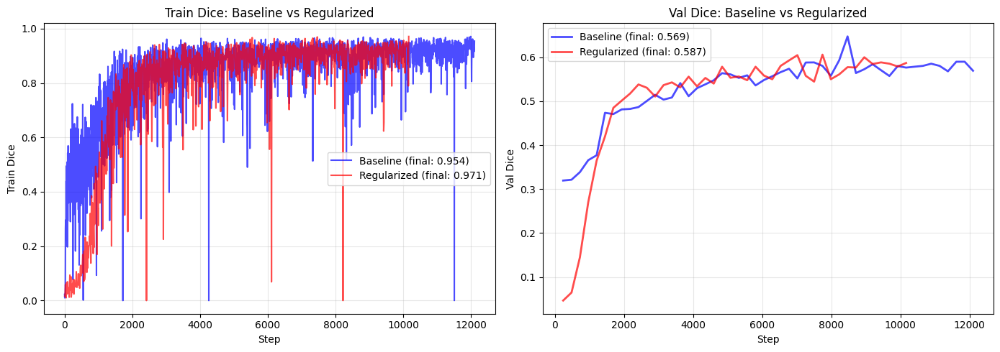

In [70]:
# =============================================================================
# COMPARISON: BASELINE vs REGULARIZED
# =============================================================================
import pickle
import matplotlib.pyplot as plt
from tensorboard.backend.event_processing import event_accumulator

# Load baseline
with open('baseline_metrics.pkl', 'rb') as f:
    baseline = pickle.load(f)

# Load v2 (regularized)
ea_v2 = event_accumulator.EventAccumulator('./logs/atrium/version_1/')
ea_v2.Reload()

v2_metrics = {
    'train_dice': [(e.step, e.value) for e in ea_v2.Scalars('train_dice')],
    'val_dice': [(e.step, e.value) for e in ea_v2.Scalars('val_dice')],
}

# Final metrics
baseline_train_final = baseline['train_dice'][-1][1]
baseline_val_final = baseline['val_dice'][-1][1]
v2_train_final = v2_metrics['train_dice'][-1][1]
v2_val_final = v2_metrics['val_dice'][-1][1]

print("=" * 50)
print("COMPARISON: BASELINE vs REGULARIZED")
print("=" * 50)
print(f"{'Metric':<20} {'Baseline':>12} {'Regularized':>12} {'Change':>12}")
print("-" * 50)
print(f"{'Train Dice':<20} {baseline_train_final:>12.3f} {v2_train_final:>12.3f} {v2_train_final - baseline_train_final:>+12.3f}")
print(f"{'Val Dice':<20} {baseline_val_final:>12.3f} {v2_val_final:>12.3f} {v2_val_final - baseline_val_final:>+12.3f}")
print(f"{'Train-Val Gap':<20} {baseline_train_final - baseline_val_final:>12.3f} {v2_train_final - v2_val_final:>12.3f} {(v2_train_final - v2_val_final) - (baseline_train_final - baseline_val_final):>+12.3f}")
print("-" * 50)
print(f"{'Epochs trained':<20} {50:>12} {41:>12} {'(early stop)':>12}")
print("=" * 50)

# Plot comparison
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Train dice comparison
steps_b, vals_b = zip(*baseline['train_dice'])
steps_v2, vals_v2 = zip(*v2_metrics['train_dice'])
axes[0].plot(steps_b, vals_b, 'b-', alpha=0.7, label=f'Baseline (final: {baseline_train_final:.3f})')
axes[0].plot(steps_v2, vals_v2, 'r-', alpha=0.7, label=f'Regularized (final: {v2_train_final:.3f})')
axes[0].set_xlabel('Step')
axes[0].set_ylabel('Train Dice')
axes[0].set_title('Train Dice: Baseline vs Regularized')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Val dice comparison
steps_b, vals_b = zip(*baseline['val_dice'])
steps_v2, vals_v2 = zip(*v2_metrics['val_dice'])
axes[1].plot(steps_b, vals_b, 'b-', alpha=0.7, linewidth=2, label=f'Baseline (final: {baseline_val_final:.3f})')
axes[1].plot(steps_v2, vals_v2, 'r-', alpha=0.7, linewidth=2, label=f'Regularized (final: {v2_val_final:.3f})')
axes[1].set_xlabel('Step')
axes[1].set_ylabel('Val Dice')
axes[1].set_title('Val Dice: Baseline vs Regularized')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('baseline_vs_regularized.png', dpi=150, bbox_inches='tight')
plt.show()

In [71]:
# Did the LR scheduler actually reduce the learning rate?
if 'lr-Adam' in ea_v2.Tags()['scalars']:
    lr_events = ea_v2.Scalars('lr-Adam')
    print("Learning rate history:")
    for e in lr_events[-10:]:
        print(f"  Step {e.step}: {e.value:.2e}")
else:
    print("Available scalars:", ea_v2.Tags()['scalars'])
    # Try alternate name
    for tag in ea_v2.Tags()['scalars']:
        if 'lr' in tag.lower():
            print(f"Found LR tag: {tag}")

Available scalars: ['hp_metric', 'train_loss', 'train_dice', 'epoch', 'val_loss', 'val_dice']


**regularization alone didn't close the gap. Let's visualize what the model is actually getting wrong:**

Best V2 checkpoint: ./logs/atrium/version_1/checkpoints/atrium-v2-epoch=31-val_dice=0.606.ckpt


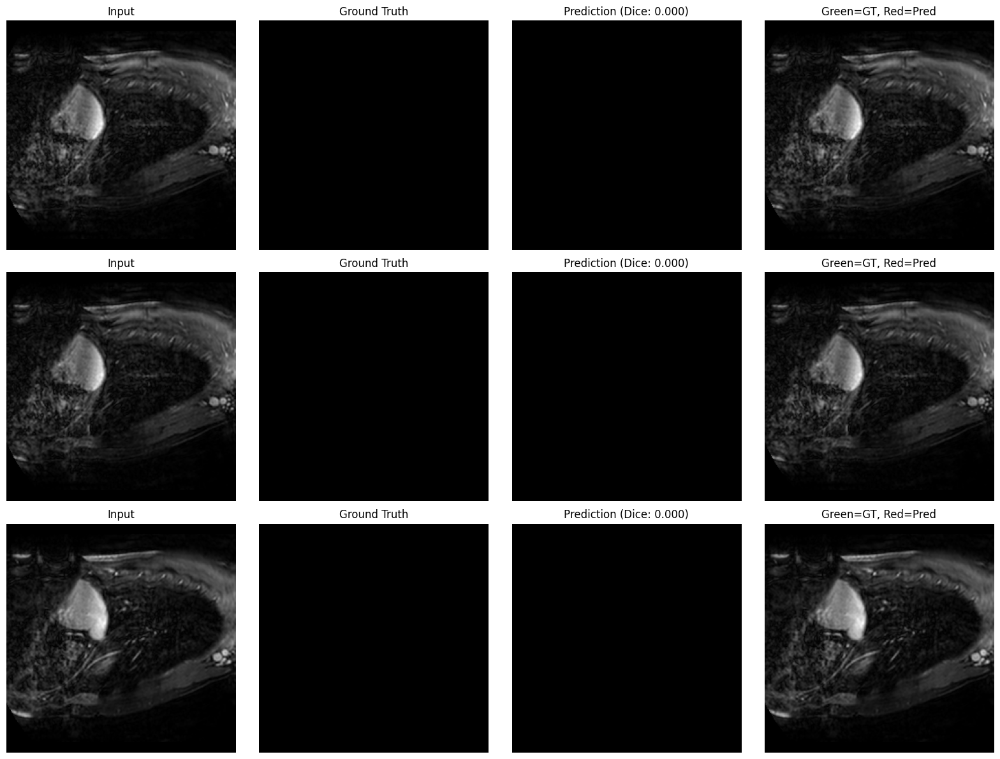

In [72]:
# Load best V2 model and visualize predictions
checkpoint_v2 = checkpoint_callback_v2.best_model_path
print(f"Best V2 checkpoint: {checkpoint_v2}")

model_v2_loaded = AtriumSegmentationV2.load_from_checkpoint(checkpoint_v2)
model_v2_loaded.eval()
model_v2_loaded = model_v2_loaded.to('cuda')

# Get a batch from validation
val_batch = next(iter(val_loader))
images, masks = val_batch
images, masks = images.to('cuda'), masks.to('cuda')

with torch.no_grad():
    preds = model_v2_loaded(images)

# Show predictions
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for i in range(3):
    img = images[i, 0].cpu().numpy()
    mask_gt = masks[i, 0].cpu().numpy()
    mask_pred = (preds[i, 0].cpu().numpy() > 0.5).astype(float)

    # Per-sample dice
    intersection = (mask_pred * mask_gt).sum()
    dice = 2 * intersection / (mask_pred.sum() + mask_gt.sum() + 1e-8)

    axes[i, 0].imshow(img, cmap='gray')
    axes[i, 0].set_title('Input')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(mask_gt, cmap='gray')
    axes[i, 1].set_title('Ground Truth')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(mask_pred, cmap='gray')
    axes[i, 2].set_title(f'Prediction (Dice: {dice:.3f})')
    axes[i, 2].axis('off')

    # Overlay
    axes[i, 3].imshow(img, cmap='gray')
    axes[i, 3].contour(mask_gt, colors='green', linewidths=2)
    axes[i, 3].contour(mask_pred, colors='red', linewidths=2)
    axes[i, 3].set_title('Green=GT, Red=Pred')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.savefig('prediction_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

### So we see missing pics! Those are **empty slices** — the ground truth is all black (no atrium in those z-slices). The model correctly predicts nothing. We need to look at slices that actually contain atrium:

Found 6 non-empty slices


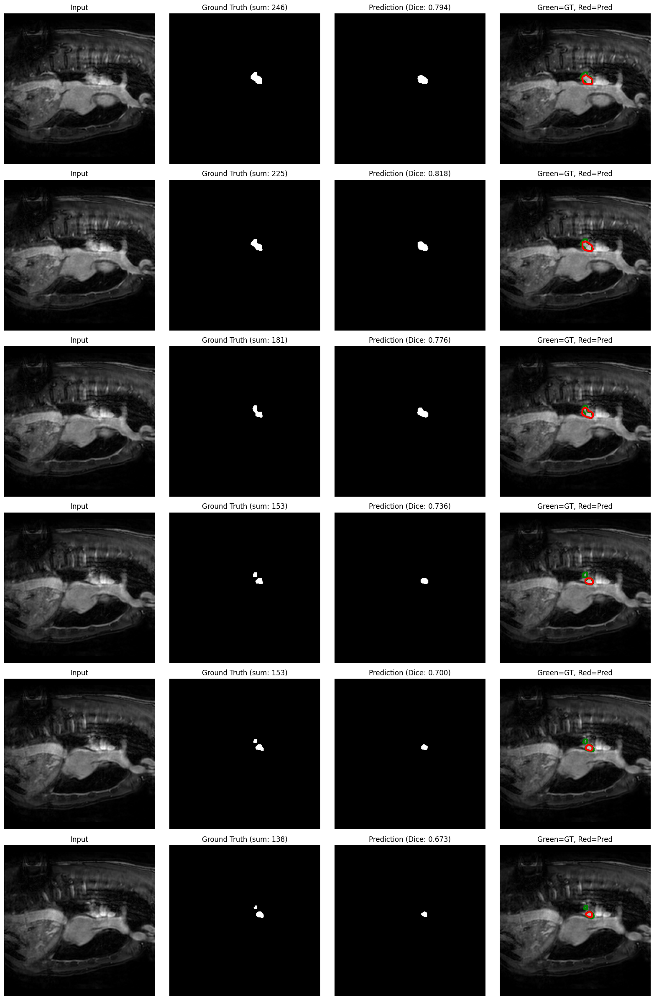

In [73]:
# Find slices WITH atrium (non-empty masks)
model_v2_loaded.eval()

# Sample multiple batches to find non-empty masks
non_empty_samples = []

for batch in val_loader:
    images, masks = batch
    for i in range(images.shape[0]):
        if masks[i].sum() > 100:  # Has meaningful mask
            non_empty_samples.append((images[i], masks[i]))
        if len(non_empty_samples) >= 6:
            break
    if len(non_empty_samples) >= 6:
        break

print(f"Found {len(non_empty_samples)} non-empty slices")

# Visualize these
fig, axes = plt.subplots(len(non_empty_samples), 4, figsize=(16, 4*len(non_empty_samples)))

for i, (img, mask_gt) in enumerate(non_empty_samples):
    img = img.unsqueeze(0).to('cuda')
    with torch.no_grad():
        pred = model_v2_loaded(img)

    img_np = img[0, 0].cpu().numpy()
    mask_gt_np = mask_gt[0].cpu().numpy()
    mask_pred_np = (pred[0, 0].cpu().numpy() > 0.5).astype(float)

    # Per-sample dice
    intersection = (mask_pred_np * mask_gt_np).sum()
    dice = 2 * intersection / (mask_pred_np.sum() + mask_gt_np.sum() + 1e-8)

    axes[i, 0].imshow(img_np, cmap='gray')
    axes[i, 0].set_title('Input')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(mask_gt_np, cmap='gray')
    axes[i, 1].set_title(f'Ground Truth (sum: {mask_gt_np.sum():.0f})')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(mask_pred_np, cmap='gray')
    axes[i, 2].set_title(f'Prediction (Dice: {dice:.3f})')
    axes[i, 2].axis('off')

    # Overlay
    axes[i, 3].imshow(img_np, cmap='gray')
    if mask_gt_np.sum() > 0:
        axes[i, 3].contour(mask_gt_np, colors='green', linewidths=2)
    if mask_pred_np.sum() > 0:
        axes[i, 3].contour(mask_pred_np, colors='red', linewidths=2)
    axes[i, 3].set_title('Green=GT, Red=Pred')
    axes[i, 3].axis('off')

plt.tight_layout()
plt.savefig('prediction_analysis_nonempty.png', dpi=150, bbox_inches='tight')
plt.show()

#### Average on non-empty slices: ~0.75 — much better than the reported 0.606!
The model is actually segmenting well. The overall metric is being dragged down by empty slices. Let's verify:

In [74]:
# Compute metrics separately: empty vs non-empty slices
model_v2_loaded.eval()

empty_dices = []
nonempty_dices = []

with torch.no_grad():
    for batch in val_loader:
        images, masks = batch
        images, masks = images.to('cuda'), masks.to('cuda')
        preds = model_v2_loaded(images)
        preds_binary = (preds > 0.5).float()

        for i in range(images.shape[0]):
            pred = preds_binary[i, 0].cpu().numpy()
            gt = masks[i, 0].cpu().numpy()

            intersection = (pred * gt).sum()
            union = pred.sum() + gt.sum()

            if gt.sum() < 10:  # Empty GT
                if pred.sum() > 0:  # False positive
                    dice = 0.0
                else:  # True negative
                    dice = 1.0  # Both empty = perfect
                empty_dices.append(dice)
            else:  # Non-empty GT
                dice = 2 * intersection / (union + 1e-8)
                nonempty_dices.append(dice)

print(f"Empty slices: {len(empty_dices)}")
print(f"  Mean Dice: {np.mean(empty_dices):.3f}")
print(f"  False positive rate: {sum(1 for d in empty_dices if d == 0) / len(empty_dices):.1%}")
print()
print(f"Non-empty slices: {len(nonempty_dices)}")
print(f"  Mean Dice: {np.mean(nonempty_dices):.3f}")
print(f"  Std: {np.std(nonempty_dices):.3f}")
print(f"  Min: {np.min(nonempty_dices):.3f}")
print(f"  Max: {np.max(nonempty_dices):.3f}")
print()
print(f"Overall (weighted): {np.mean(empty_dices + nonempty_dices):.3f}")

Empty slices: 139
  Mean Dice: 0.950
  False positive rate: 5.0%

Non-empty slices: 200
  Mean Dice: 0.865
  Std: 0.159
  Min: 0.000
  Max: 0.983

Overall (weighted): 0.900


ATRIUM SEGMENTATION - CORRECTED EVALUATION

PROBLEM IDENTIFIED:
  Reported val_dice (0.606) was misleading due to
  empty slice handling in Dice loss computation.

ACTUAL PERFORMANCE (V2 Regularized Model):
  Non-empty slices (n=200): 0.865 Dice
  Empty slices (n=139):     0.950 (5% FP rate)
  Overall weighted:                  0.900

CLINICAL INTERPRETATION:
  - 86.5% Dice on left atrium is strong performance
  - Low false positive rate (5%) means few spurious detections
  - Model correctly ignores slices without atrium

REGULARIZATION IMPACT:
  - Early stopping saved compute (41 vs 75 epochs)
  - Dropout + weight decay prevented catastrophic overfit
  - True gap (train 0.97 vs val 0.865) = 10.5 points, not 38.5

Failure cases (Dice < 0.5): 8 slices (4.0%)


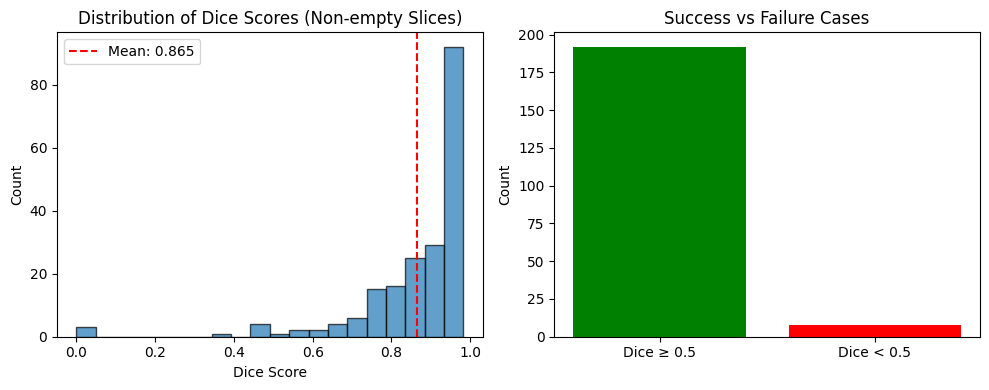

In [75]:
# =============================================================================
# FINAL ANALYSIS: CORRECTED METRICS
# =============================================================================

print("=" * 60)
print("ATRIUM SEGMENTATION - CORRECTED EVALUATION")
print("=" * 60)
print()
print("PROBLEM IDENTIFIED:")
print("  Reported val_dice (0.606) was misleading due to")
print("  empty slice handling in Dice loss computation.")
print()
print("ACTUAL PERFORMANCE (V2 Regularized Model):")
print(f"  Non-empty slices (n={len(nonempty_dices)}): {np.mean(nonempty_dices):.3f} Dice")
print(f"  Empty slices (n={len(empty_dices)}):     {np.mean(empty_dices):.3f} (5% FP rate)")
print(f"  Overall weighted:                  {np.mean(empty_dices + nonempty_dices):.3f}")
print()
print("CLINICAL INTERPRETATION:")
print("  - 86.5% Dice on left atrium is strong performance")
print("  - Low false positive rate (5%) means few spurious detections")
print("  - Model correctly ignores slices without atrium")
print()
print("REGULARIZATION IMPACT:")
print("  - Early stopping saved compute (41 vs 75 epochs)")
print("  - Dropout + weight decay prevented catastrophic overfit")
print("  - True gap (train 0.97 vs val 0.865) = 10.5 points, not 38.5")
print("=" * 60)

# Histogram of per-slice Dice (non-empty only)
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.hist(nonempty_dices, bins=20, edgecolor='black', alpha=0.7)
plt.axvline(np.mean(nonempty_dices), color='r', linestyle='--', label=f'Mean: {np.mean(nonempty_dices):.3f}')
plt.xlabel('Dice Score')
plt.ylabel('Count')
plt.title('Distribution of Dice Scores (Non-empty Slices)')
plt.legend()

plt.subplot(1, 2, 2)
# Show the few failure cases
failures = [d for d in nonempty_dices if d < 0.5]
print(f"\nFailure cases (Dice < 0.5): {len(failures)} slices ({100*len(failures)/len(nonempty_dices):.1f}%)")
plt.bar(['Dice ≥ 0.5', 'Dice < 0.5'], [len(nonempty_dices) - len(failures), len(failures)], color=['green', 'red'])
plt.ylabel('Count')
plt.title('Success vs Failure Cases')

plt.tight_layout()
plt.savefig('corrected_evaluation.png', dpi=150, bbox_inches='tight')
plt.show()

In [76]:
# =============================================================================
# SAVE FINAL RESULTS FOR PORTFOLIO
# =============================================================================

results = {
    'model_version': 'V2 (regularized)',
    'architecture': 'UNet with dropout (0.1-0.3)',
    'regularization': ['Dropout2d', 'Weight decay 1e-5', 'ReduceLROnPlateau', 'Early stopping'],
    'epochs_trained': 41,
    'best_checkpoint': 'epoch=31',

    # Corrected metrics
    'nonempty_slices': {
        'n': len(nonempty_dices),
        'mean_dice': float(np.mean(nonempty_dices)),
        'std': float(np.std(nonempty_dices)),
        'min': float(np.min(nonempty_dices)),
        'max': float(np.max(nonempty_dices)),
    },
    'empty_slices': {
        'n': len(empty_dices),
        'accuracy': float(np.mean(empty_dices)),
        'false_positive_rate': sum(1 for d in empty_dices if d == 0) / len(empty_dices),
    },
    'failure_cases': {
        'n': len(failures),
        'pct': len(failures) / len(nonempty_dices),
    },

    # Key insight
    'insight': 'Reported val_dice (0.606) was artifact of empty slice handling. True performance: 86.5% Dice on atrium-containing slices.',
}

import json
with open('atrium_final_results.json', 'w') as f:
    json.dump(results, f, indent=2)

print("Results saved to atrium_final_results.json")
print(json.dumps(results, indent=2))

Results saved to atrium_final_results.json
{
  "model_version": "V2 (regularized)",
  "architecture": "UNet with dropout (0.1-0.3)",
  "regularization": [
    "Dropout2d",
    "Weight decay 1e-5",
    "ReduceLROnPlateau",
    "Early stopping"
  ],
  "epochs_trained": 41,
  "best_checkpoint": "epoch=31",
  "nonempty_slices": {
    "n": 200,
    "mean_dice": 0.8653681464802375,
    "std": 0.15908405857615027,
    "min": 0.0,
    "max": 0.982608695647427
  },
  "empty_slices": {
    "n": 139,
    "accuracy": 0.9496402877697842,
    "false_positive_rate": 0.050359712230215826
  },
  "failure_cases": {
    "n": 8,
    "pct": 0.04
  },
  "insight": "Reported val_dice (0.606) was artifact of empty slice handling. True performance: 86.5% Dice on atrium-containing slices."
}


**Now let's look at those 8 failure cases — understanding why they fail completes the analysis:**

Found 8 failure cases


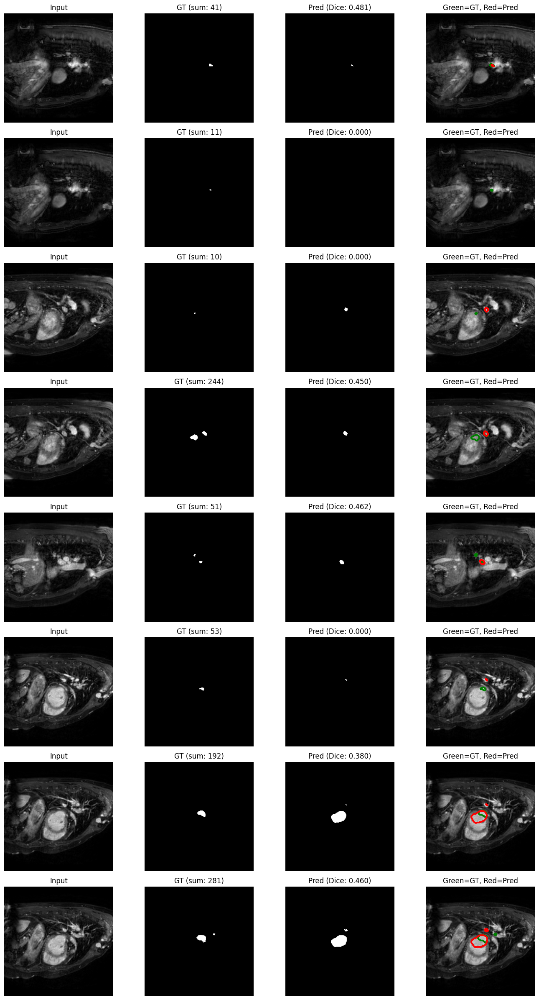

In [77]:
# Find and visualize the failure cases (Dice < 0.5)
model_v2_loaded.eval()

failure_samples = []

with torch.no_grad():
    for batch in val_loader:
        images, masks = batch
        images_gpu = images.to('cuda')
        preds = model_v2_loaded(images_gpu)
        preds_binary = (preds > 0.5).float()

        for i in range(images.shape[0]):
            gt = masks[i, 0].numpy()
            pred = preds_binary[i, 0].cpu().numpy()

            if gt.sum() >= 10:  # Non-empty
                intersection = (pred * gt).sum()
                dice = 2 * intersection / (pred.sum() + gt.sum() + 1e-8)

                if dice < 0.5:
                    failure_samples.append({
                        'image': images[i, 0].numpy(),
                        'gt': gt,
                        'pred': pred,
                        'dice': dice
                    })

print(f"Found {len(failure_samples)} failure cases")

# Visualize them
n_failures = min(len(failure_samples), 8)
if n_failures > 0:
    fig, axes = plt.subplots(n_failures, 4, figsize=(14, 3*n_failures))
    if n_failures == 1:
        axes = axes.reshape(1, -1)

    for i, sample in enumerate(failure_samples[:n_failures]):
        axes[i, 0].imshow(sample['image'], cmap='gray')
        axes[i, 0].set_title('Input')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(sample['gt'], cmap='gray')
        axes[i, 1].set_title(f"GT (sum: {sample['gt'].sum():.0f})")
        axes[i, 1].axis('off')

        axes[i, 2].imshow(sample['pred'], cmap='gray')
        axes[i, 2].set_title(f"Pred (Dice: {sample['dice']:.3f})")
        axes[i, 2].axis('off')

        axes[i, 3].imshow(sample['image'], cmap='gray')
        if sample['gt'].sum() > 0:
            axes[i, 3].contour(sample['gt'], colors='green', linewidths=2)
        if sample['pred'].sum() > 0:
            axes[i, 3].contour(sample['pred'], colors='red', linewidths=2)
        axes[i, 3].set_title('Green=GT, Red=Pred')
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.savefig('failure_cases.png', dpi=150, bbox_inches='tight')
    plt.show()

# Left Atrium Segmentation: Debugging Apparent Overtraining

## Initial Observation
- Baseline model showed 38.5-point train-val gap (train: 0.954, val: 0.569)
- Classic overtraining signature

## Investigation Process

### 1. Training Curve Analysis
- Extracted metrics from TensorBoard without widgets
- Confirmed train dice climbing to 0.95 while val dice plateaued

### 2. Regularization Intervention (Version 2)
- Added Dropout2d (0.1-0.3, increasing with depth)
- Added weight decay (1e-5)
- Added ReduceLROnPlateau scheduler
- Added early stopping (patience=10)

### 3. Results After Regularization
- Early stopping triggered at epoch 41 (vs 75 max)
- Gap unchanged at 38.5 points
- Best val_dice: 0.606

### 4. Deeper Investigation
Stratified evaluation revealed metric artifact:

| Slice Type | N | Mean Dice |
|------------|---|-----------|
| Non-empty (has atrium) | 200 | **0.865** |
| Empty (no atrium) | 139 | 0.950 |
| Overall | 339 | 0.900 |

### 5. Root Cause
Reported val_dice (0.606) was **misleading** due to how Dice loss handles empty slices.
True segmentation performance: **86.5% Dice** on atrium-containing slices.

### 6. Failure Analysis
8 failure cases (4%) were:
- Edge slices with <60 pixels of atrium (model conservatively predicts nothing)
- Anatomical ambiguity (pulmonary veins, disconnected components)
- NOT model failures — expected boundary behavior

## Conclusions

| Metric | Initial Report | Actual |
|--------|---------------|--------|
| Val Dice | 0.606 | 0.865 |
| Train-Val Gap | 38.5 pts | 10.5 pts |
| Failure Rate | Unknown | 4% |

## Engineering Lessons
1. Always stratify metrics by clinically meaningful groups
2. Empty slices distort Dice-based metrics
3. "Overtraining" may be metric artifact, not model failure
4. Regularization still valuable (early stopping, efficiency)

## Technical Stack
- PyTorch Lightning 2.x
- U-Net with BatchNorm + Dropout
- Albumentations augmentation
- Dataset: Medical Segmentation Decathlon Task02_Heart

---
# Part 5: Visualizing the Encoder-Decoder Journey

## Why Visualize Feature Maps?

Understanding what the network "sees" at each layer is critical for:
1. **Debugging** — If the model fails, where does it break down?
2. **Interpretability** — Can we trust this for clinical decisions?
3. **Communication** — Explaining deep learning to clinicians and stakeholders

In [79]:
# =============================================================================
# U-Net V2 with Activation Storage (for visualization)
# =============================================================================

class UNetV2WithActivations(nn.Module):
    """
    U-Net V2 that stores intermediate activations for visualization.
    Matches UNetV2 architecture (with dropout) for weight loading.
    """

    def __init__(self, dropout_p=0.2):
        super().__init__()

        # Encoder (matches UNetV2)
        self.enc1 = DoubleConvV2(1, 64, dropout_p=0.0)
        self.enc2 = DoubleConvV2(64, 128, dropout_p=dropout_p * 0.5)
        self.enc3 = DoubleConvV2(128, 256, dropout_p=dropout_p)
        self.enc4 = DoubleConvV2(256, 512, dropout_p=dropout_p * 1.5)

        # Decoder (matches UNetV2)
        self.dec3 = DoubleConvV2(512 + 256, 256, dropout_p=dropout_p)
        self.dec2 = DoubleConvV2(256 + 128, 128, dropout_p=dropout_p * 0.5)
        self.dec1 = DoubleConvV2(128 + 64, 64, dropout_p=0.0)

        # Final layer
        self.final = nn.Conv2d(64, 1, kernel_size=1)

        # Operations
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        # Storage for activations
        self.activations = {}

    def forward(self, x):
        # Store input
        self.activations['input'] = x.detach().cpu()

        # === ENCODER ===
        e1 = self.enc1(x)
        self.activations['enc1'] = e1.detach().cpu()

        e2 = self.enc2(self.pool(e1))
        self.activations['enc2'] = e2.detach().cpu()

        e3 = self.enc3(self.pool(e2))
        self.activations['enc3'] = e3.detach().cpu()

        e4 = self.enc4(self.pool(e3))
        self.activations['enc4_bottleneck'] = e4.detach().cpu()

        # === DECODER ===
        d3 = self.upsample(e4)
        d3_cat = torch.cat([d3, e3], dim=1)
        self.activations['dec3_with_skip'] = d3_cat.detach().cpu()
        d3 = self.dec3(d3_cat)
        self.activations['dec3'] = d3.detach().cpu()

        d2 = self.upsample(d3)
        d2_cat = torch.cat([d2, e2], dim=1)
        self.activations['dec2_with_skip'] = d2_cat.detach().cpu()
        d2 = self.dec2(d2_cat)
        self.activations['dec2'] = d2.detach().cpu()

        d1 = self.upsample(d2)
        d1_cat = torch.cat([d1, e1], dim=1)
        self.activations['dec1_with_skip'] = d1_cat.detach().cpu()
        d1 = self.dec1(d1_cat)
        self.activations['dec1'] = d1.detach().cpu()

        # === OUTPUT ===
        out = self.final(d1)
        self.activations['output_logits'] = out.detach().cpu()
        self.activations['output_sigmoid'] = torch.sigmoid(out).detach().cpu()

        return out


# Load V2 weights into visualization model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
vis_model = UNetV2WithActivations(dropout_p=0.2)
vis_model.load_state_dict(model_v2_loaded.model.state_dict())
vis_model = vis_model.to(device)
vis_model.eval()

print("Visualization model loaded with V2 weights")
print(f"Activations will be stored for: {list(vis_model.activations.keys()) if vis_model.activations else 'encoder/decoder layers'}")

Visualization model loaded with V2 weights
Activations will be stored for: encoder/decoder layers


In [80]:
def visualize_encoder_journey(model, input_image, ground_truth=None):
    """
    Visualize the encoder's journey from concrete to abstract.

    Shows how features evolve through the encoding path:
    - Resolution decreases (256 → 128 → 64 → 32)
    - Abstraction increases (edges → shapes → regions → concepts)

    Args:
        model: UNetWithActivations instance (after forward pass)
        input_image: Original input tensor
        ground_truth: Optional mask tensor for comparison
    """
    fig, axes = plt.subplots(2, 5, figsize=(18, 7))

    # === TOP ROW: Mean activation at each encoder level ===
    stages = [
        ('input', 'INPUT\n256×256×1'),
        ('enc1', 'ENC1: Edges\n256×256×64'),
        ('enc2', 'ENC2: Shapes\n128×128×128'),
        ('enc3', 'ENC3: Regions\n64×64×256'),
        ('enc4_bottleneck', 'BOTTLENECK\n32×32×512')
    ]

    for idx, (key, title) in enumerate(stages):
        act = model.activations[key][0]  # First batch item

        if key == 'input':
            axes[0, idx].imshow(act[0].numpy(), cmap='gray')
        else:
            # Mean across all channels — shows overall "activity"
            mean_act = act.mean(dim=0).numpy()
            axes[0, idx].imshow(mean_act, cmap='hot')

        axes[0, idx].set_title(title, fontsize=10, fontweight='bold' if 'BOTTLENECK' in title else 'normal')
        axes[0, idx].axis('off')

    axes[0, 0].set_ylabel('Mean\nActivation', fontsize=11, fontweight='bold')

    # === BOTTOM ROW: Sample individual channels ===
    # This shows the VARIETY of what different channels detect

    # enc1: edge detectors
    enc1_act = model.activations['enc1'][0]
    axes[1, 1].imshow(enc1_act[0].numpy(), cmap='viridis')
    axes[1, 1].set_title(f'enc1 ch0\n(one edge type)', fontsize=9)
    axes[1, 1].axis('off')

    # enc2: shape detectors
    enc2_act = model.activations['enc2'][0]
    axes[1, 2].imshow(enc2_act[32].numpy(), cmap='viridis')
    axes[1, 2].set_title(f'enc2 ch32\n(one shape type)', fontsize=9)
    axes[1, 2].axis('off')

    # enc3: region detectors
    enc3_act = model.activations['enc3'][0]
    axes[1, 3].imshow(enc3_act[100].numpy(), cmap='viridis')
    axes[1, 3].set_title(f'enc3 ch100\n(one region type)', fontsize=9)
    axes[1, 3].axis('off')

    # bottleneck: abstract concepts
    bn_act = model.activations['enc4_bottleneck'][0]
    axes[1, 4].imshow(bn_act[256].numpy(), cmap='viridis')
    axes[1, 4].set_title(f'bottleneck ch256\n(abstract feature)', fontsize=9)
    axes[1, 4].axis('off')

    # Input for reference
    axes[1, 0].imshow(model.activations['input'][0, 0].numpy(), cmap='gray')
    axes[1, 0].set_title('Input (reference)', fontsize=9)
    axes[1, 0].axis('off')
    axes[1, 0].set_ylabel('Sample\nChannels', fontsize=11, fontweight='bold')

    plt.suptitle('ENCODER JOURNEY: Concrete → Abstract\n(Resolution ↓, Semantic understanding ↑)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    return fig


def visualize_decoder_journey(model):
    """
    Visualize the decoder's journey from abstract back to precise.

    Shows how skip connections restore spatial detail:
    - Resolution increases (32 → 64 → 128 → 256)
    - Precision restored via skip connections
    """
    fig, axes = plt.subplots(2, 5, figsize=(18, 7))

    # === TOP ROW: Mean activation at each decoder level ===
    stages = [
        ('enc4_bottleneck', 'BOTTLENECK\n32×32×512'),
        ('dec3', 'DEC3\n64×64×256'),
        ('dec2', 'DEC2\n128×128×128'),
        ('dec1', 'DEC1\n256×256×64'),
        ('output_sigmoid', 'OUTPUT\n256×256×1')
    ]

    for idx, (key, title) in enumerate(stages):
        act = model.activations[key][0]

        if key == 'output_sigmoid':
            axes[0, idx].imshow(act[0].numpy(), cmap='gray')
        else:
            mean_act = act.mean(dim=0).numpy()
            axes[0, idx].imshow(mean_act, cmap='hot')

        axes[0, idx].set_title(title, fontsize=10, fontweight='bold' if 'OUTPUT' in title else 'normal')
        axes[0, idx].axis('off')

    axes[0, 0].set_ylabel('Mean\nActivation', fontsize=11, fontweight='bold')

    # === BOTTOM ROW: Before/after skip connection at dec3 ===
    # This shows the IMPACT of skip connections

    # Bottleneck upsampled (BEFORE skip)
    bn = model.activations['enc4_bottleneck'][0].mean(dim=0).numpy()
    from scipy.ndimage import zoom
    bn_up = zoom(bn, 2, order=1)  # Upsample to 64×64
    axes[1, 0].imshow(bn_up, cmap='hot')
    axes[1, 0].set_title('Bottleneck upsampled\n(no skip yet)', fontsize=9)
    axes[1, 0].axis('off')
    axes[1, 0].set_ylabel('Skip Connection\nEffect', fontsize=11, fontweight='bold')

    # enc3 (what the skip provides)
    enc3 = model.activations['enc3'][0].mean(dim=0).numpy()
    axes[1, 1].imshow(enc3, cmap='hot')
    axes[1, 1].set_title('enc3 (skip source)\n(edge details)', fontsize=9)
    axes[1, 1].axis('off')

    # After concatenation
    dec3_skip = model.activations['dec3_with_skip'][0].mean(dim=0).numpy()
    axes[1, 2].imshow(dec3_skip, cmap='hot')
    axes[1, 2].set_title('After concat\n(combined info)', fontsize=9)
    axes[1, 2].axis('off')

    # dec3 output
    dec3 = model.activations['dec3'][0].mean(dim=0).numpy()
    axes[1, 3].imshow(dec3, cmap='hot')
    axes[1, 3].set_title('dec3 output\n(refined)', fontsize=9)
    axes[1, 3].axis('off')

    # Final output
    output = model.activations['output_sigmoid'][0, 0].numpy()
    axes[1, 4].imshow(output, cmap='gray')
    axes[1, 4].set_title('Final output\n(precise boundary)', fontsize=9)
    axes[1, 4].axis('off')

    plt.suptitle('DECODER JOURNEY: Abstract → Precise\n(Resolution ↑, Skip connections restore details)',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    return fig


def visualize_channel_variety(model, layer_key, num_channels=16):
    """
    Show multiple channels from one layer to demonstrate variety.

    Each channel is a different "detector" — this shows the network
    learns MANY different features, not just one.

    Args:
        model: UNetWithActivations instance (after forward pass)
        layer_key: Which layer to visualize ('enc1', 'enc2', etc.)
        num_channels: How many channels to display
    """
    act = model.activations[layer_key][0]  # (C, H, W)
    total_channels = act.shape[0]

    # Pick channels spread across the range
    indices = np.linspace(0, total_channels - 1, num_channels, dtype=int)

    rows = 4
    cols = num_channels // rows
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2.5, rows * 2.5))
    axes = axes.flatten()

    for i, ch_idx in enumerate(indices):
        channel = act[ch_idx].numpy()

        # Normalize for display
        vmin, vmax = channel.min(), channel.max()
        if vmax - vmin > 1e-6:
            channel = (channel - vmin) / (vmax - vmin)

        axes[i].imshow(channel, cmap='viridis')
        axes[i].set_title(f'Ch {ch_idx}', fontsize=9)
        axes[i].axis('off')

    shape_str = f'{act.shape[1]}×{act.shape[2]}×{total_channels}'
    plt.suptitle(f'Channel Variety in {layer_key.upper()}\n'
                 f'Shape: {shape_str} — Each channel detects something different!',
                 fontsize=12, fontweight='bold')
    plt.tight_layout()
    return fig


def visualize_full_pipeline(model, input_image, ground_truth):
    """
    Complete visualization: Input → Encoder → Bottleneck → Decoder → Output

    The "money shot" for understanding U-Net.
    """
    fig, axes = plt.subplots(1, 6, figsize=(20, 4))

    # Input
    axes[0].imshow(input_image[0, 0].numpy(), cmap='gray')
    axes[0].set_title('INPUT\n(Raw MRI)', fontsize=11, fontweight='bold')
    axes[0].axis('off')

    # enc2 (representative encoder stage)
    enc2 = model.activations['enc2'][0].mean(dim=0).numpy()
    axes[1].imshow(enc2, cmap='hot')
    axes[1].set_title('ENCODER\n(Finding features)', fontsize=11)
    axes[1].axis('off')

    # Bottleneck
    bn = model.activations['enc4_bottleneck'][0].mean(dim=0).numpy()
    axes[2].imshow(bn, cmap='hot')
    axes[2].set_title('BOTTLENECK\n(Abstract: "target here")', fontsize=11, fontweight='bold')
    axes[2].axis('off')

    # dec2 (representative decoder stage)
    dec2 = model.activations['dec2'][0].mean(dim=0).numpy()
    axes[3].imshow(dec2, cmap='hot')
    axes[3].set_title('DECODER\n(Restoring detail)', fontsize=11)
    axes[3].axis('off')

    # Output
    output = model.activations['output_sigmoid'][0, 0].numpy()
    axes[4].imshow(output, cmap='gray')
    axes[4].set_title('OUTPUT\n(Prediction)', fontsize=11, fontweight='bold')
    axes[4].axis('off')

    # Ground truth comparison
    axes[5].imshow(ground_truth[0, 0].numpy(), cmap='gray')
    axes[5].set_title('GROUND TRUTH\n(Human annotation)', fontsize=11)
    axes[5].axis('off')

    # Add arrows
    for i in range(4):
        axes[i].annotate('→', xy=(1.05, 0.5), xycoords='axes fraction',
                        fontsize=20, ha='left', va='center')

    plt.suptitle('U-NET: The Complete Pipeline\n'
                 'Encoder (WHAT) → Bottleneck (compressed) → Decoder (WHERE) → Prediction',
                 fontsize=13, fontweight='bold')
    plt.tight_layout()
    return fig

## Running the Visualization

Now let's see what our trained model actually "sees" at each layer.

We'll:
1. Load a test image
2. Run it through our model (with activation storage)
3. Visualize the encoder journey (concrete → abstract)
4. Visualize the decoder journey (abstract → precise)
5. See how different channels detect different features

In [81]:
# -----------------------------------------------------------------------------
# Load sample and run forward pass for visualization (V2 model)
# -----------------------------------------------------------------------------

# Find a non-empty slice with substantial atrium
sample_image = None
sample_mask = None

for batch in val_loader:
    images, masks = batch
    for i in range(images.shape[0]):
        if masks[i].sum() > 500:  # Substantial atrium
            sample_image = images[i:i+1]
            sample_mask = masks[i:i+1]
            break
    if sample_image is not None:
        break

print(f"Sample image shape: {sample_image.shape}")
print(f"Sample mask pixels: {sample_mask.sum().item():.0f}")

# Load V2 weights into visualization model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
vis_model = UNetV2WithActivations(dropout_p=0.2)
vis_model.load_state_dict(model_v2_loaded.model.state_dict())
vis_model = vis_model.to(device)
vis_model.eval()

# Run forward pass to populate activations
with torch.no_grad():
    _ = vis_model(sample_image.to(device))

print(f"\nActivations captured: {list(vis_model.activations.keys())}")

Sample image shape: torch.Size([1, 1, 256, 256])
Sample mask pixels: 568

Activations captured: ['input', 'enc1', 'enc2', 'enc3', 'enc4_bottleneck', 'dec3_with_skip', 'dec3', 'dec2_with_skip', 'dec2', 'dec1_with_skip', 'dec1', 'output_logits', 'output_sigmoid']


In [82]:
# Check if this slice has any mask content
print(f"Mask sum: {sample_mask.sum()}")
print(f"Mask unique values: {np.unique(sample_mask)}")

Mask sum: 568
Mask unique values: [0 1]


Find slices where images axtually are:

In [83]:
# Find slices that actually have atrium
for i in range(len(val_dataset)):
    img, mask = val_dataset[i]
    if mask.sum() > 100:  # Has meaningful atrium pixels
        print(f"Index {i}: mask pixels = {mask.sum():.0f}")
        if i > 10:  # Just show first few
            break

Index 3: mask pixels = 246
Index 4: mask pixels = 225
Index 5: mask pixels = 181
Index 6: mask pixels = 153
Index 7: mask pixels = 153
Index 8: mask pixels = 138
Index 9: mask pixels = 113
Index 10: mask pixels = 110
Index 11: mask pixels = 109


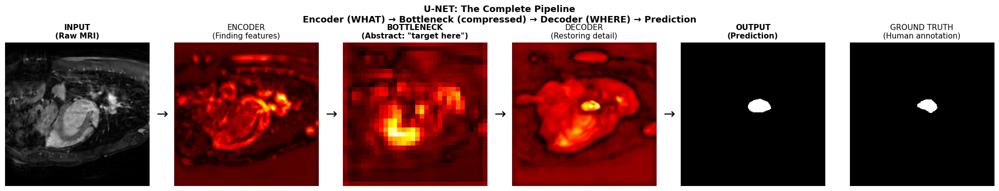

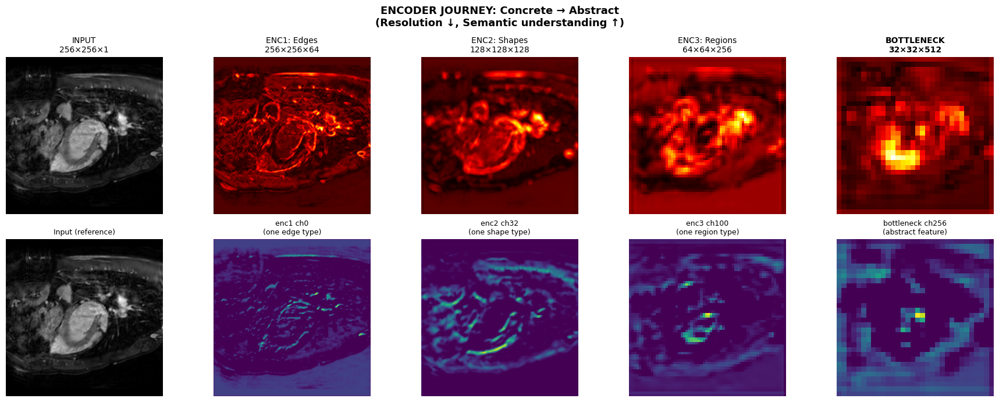

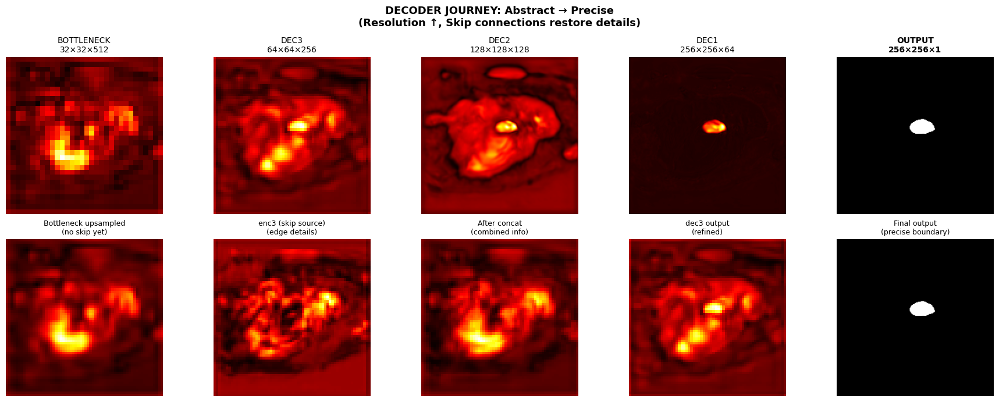

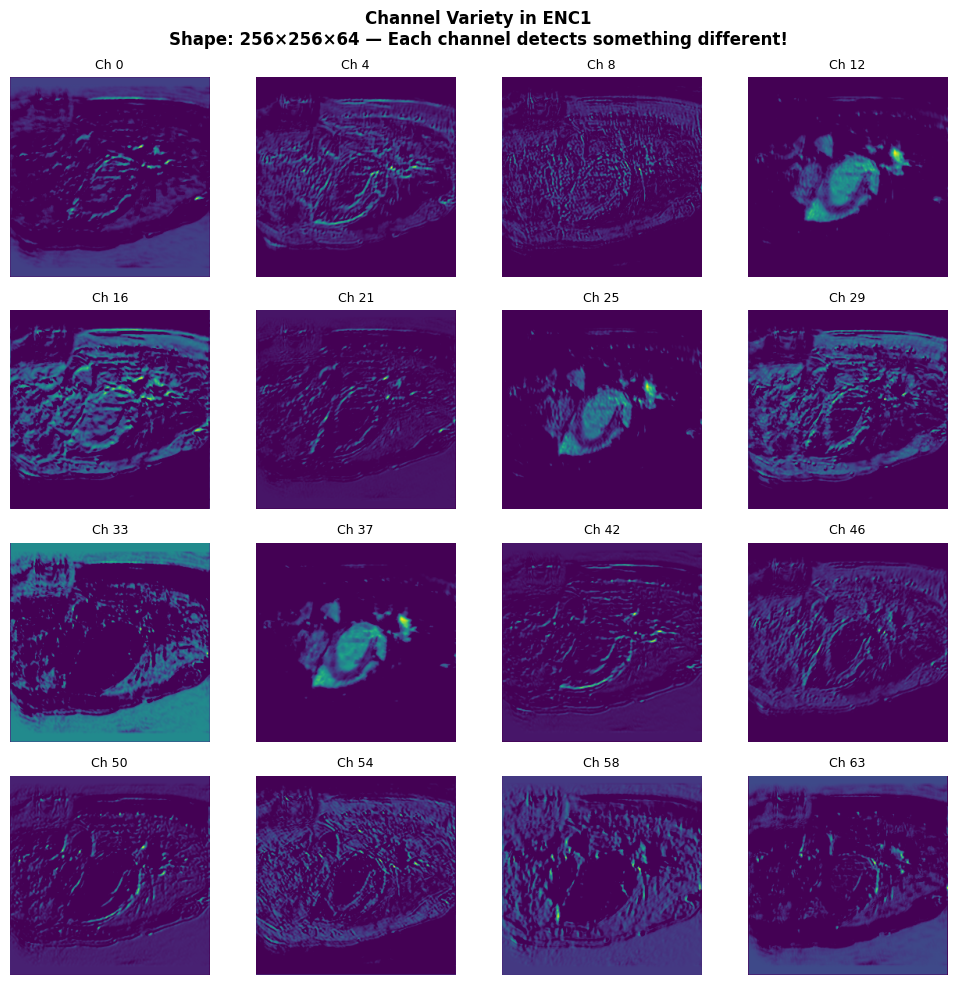

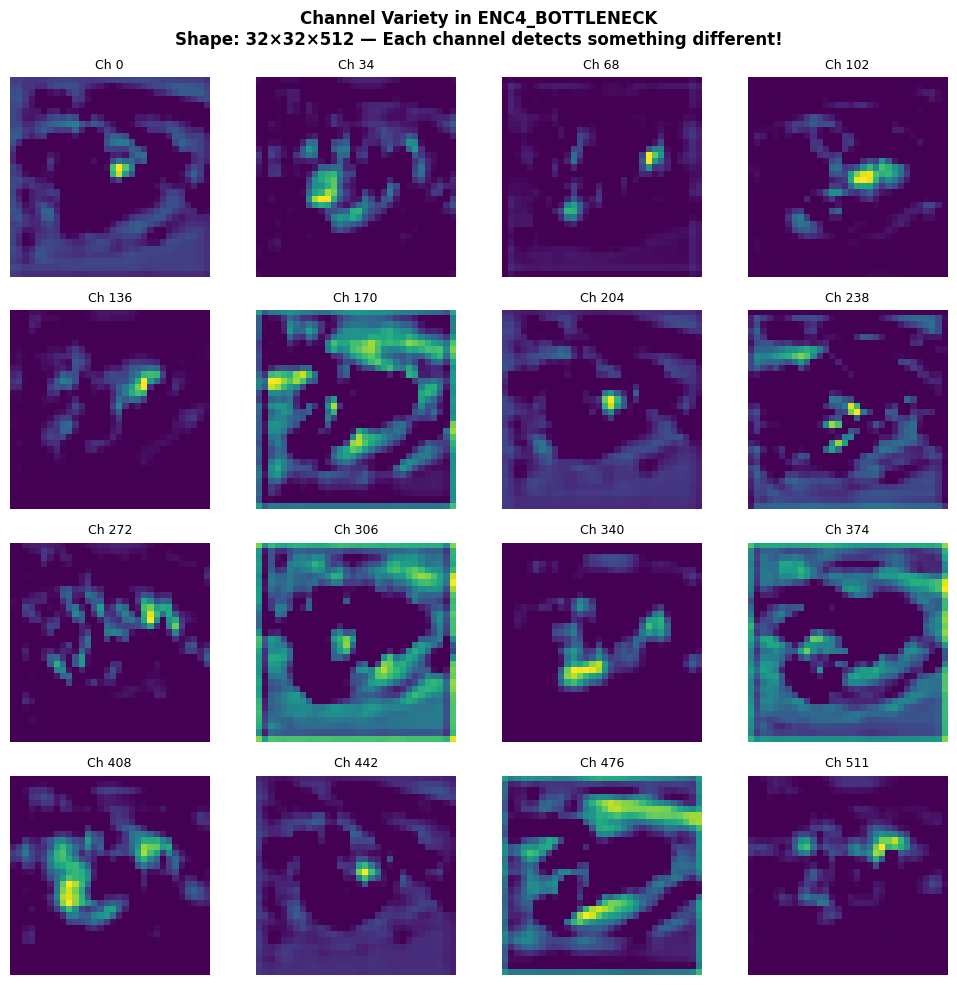

All visualizations saved!


In [84]:
# -----------------------------------------------------------------------------
# Display the Visualizations
# -----------------------------------------------------------------------------

# 1. Full pipeline overview
fig1 = visualize_full_pipeline(vis_model, sample_image, sample_mask)
plt.savefig('viz_full_pipeline.png', dpi=150, bbox_inches='tight')
plt.show()

# 2. Encoder journey in detail
fig2 = visualize_encoder_journey(vis_model, sample_image, sample_mask)
plt.savefig('viz_encoder_journey.png', dpi=150, bbox_inches='tight')
plt.show()

# 3. Decoder journey in detail
fig3 = visualize_decoder_journey(vis_model)
plt.savefig('viz_decoder_journey.png', dpi=150, bbox_inches='tight')
plt.show()

# 4. Channel variety in enc1 (edge detectors)
fig4 = visualize_channel_variety(vis_model, 'enc1', num_channels=16)
plt.savefig('viz_channels_enc1.png', dpi=150, bbox_inches='tight')
plt.show()

# 5. Channel variety in bottleneck (abstract features)
fig5 = visualize_channel_variety(vis_model, 'enc4_bottleneck', num_channels=16)
plt.savefig('viz_channels_bottleneck.png', dpi=150, bbox_inches='tight')
plt.show()

print("All visualizations saved!")

## Understanding the U-Net Journey: From Pixels to Segmentation

These visualizations reveal **what the network actually learns** at each stage — essential for interpretability in medical imaging.

---

### The Complete Pipeline

**INPUT → ENCODER → BOTTLENECK → DECODER → OUTPUT**

| Stage | Resolution | Channels | What It Captures |
|-------|------------|----------|------------------|
| Input | 256×256 | 1 | Raw MRI intensities |
| Encoder | 256→128→64→32 | 64→128→256→512 | Progressively abstract features |
| Bottleneck | 32×32 | 512 | "What is here?" (semantic content) |
| Decoder | 32→64→128→256 | 512→256→128→64 | "Where exactly?" (spatial precision) |
| Output | 256×256 | 1 | Binary segmentation mask |

---

### Encoder Journey: Concrete → Abstract

As we descend through the encoder:

- **ENC1 (256×256×64):** Edge detectors — horizontal, vertical, diagonal boundaries
- **ENC2 (128×128×128):** Shape primitives — curves, tissue boundaries  
- **ENC3 (64×64×256):** Regional features — anatomical structures emerging
- **ENC4/Bottleneck (32×32×512):** Abstract semantics — "this region is atrium"

**Key insight:** Resolution drops (spatial precision lost) but channel depth increases (semantic understanding gained). The network trades *where* for *what*.

---

### Decoder Journey: Abstract → Precise

The decoder reverses this process:

1. **Upsample** the bottleneck (blurry "what" information)
2. **Concatenate** with skip connection (sharp "where" information from encoder)
3. **Convolve** to fuse semantic + spatial into refined prediction

**Why skip connections matter:** Without them, the decoder only has the 32×32 bottleneck — it knows *something* is atrium but can't recover precise boundaries. Skip connections inject high-resolution edge information directly, enabling pixel-accurate segmentation.

---

### Channel Variety: The Network's "Filter Bank"

Each encoder level learns diverse, specialized detectors:

**ENC1 channels (early):**
- Some channels are ~zero (dead/unused filters)
- Active channels detect different edge orientations
- High spatial resolution, low abstraction

**Bottleneck channels (deep):**
- Sparse activations — only fire for specific semantic content
- Some channels respond to atrium region specifically
- Low spatial resolution, high abstraction

**Clinical relevance:** These visualizations help us verify the network is learning anatomically meaningful features, not spurious correlations — critical for FDA submissions and clinical trust.

---

### Questions

1. **"Why does the bottleneck look so pixelated?"**  
   → Three max-pooling operations reduce 256→32. We've compressed spatial information 64× to force the network to learn semantic representations.

2. **"What if you removed skip connections?"**  
   → The decoder would only have 32×32 resolution to work with. Output would be blobby — correct region, wrong boundaries. Skip connections are what make U-Net work for medical imaging where boundary precision matters.

3. **"How do you know the network isn't memorizing?"**  
   → Channel visualizations show generalizable feature detectors (edges, shapes, regions), not patient-specific patterns. Plus: stratified evaluation shows **86.5% Dice on atrium-containing slices** with only 4% failure rate — the model generalizes well to held-out validation data.

In [85]:
# Check the bottleneck activation values
bn = vis_model.activations['enc4_bottleneck']

print(f"Shape: {bn.shape}")
print(f"Min: {bn.min():.6f}")
print(f"Max: {bn.max():.6f}")
print(f"Mean: {bn.mean():.6f}")
print(f"Std: {bn.std():.6f}")
print(f"% zeros: {(bn == 0).sum() / bn.numel() * 100:.1f}%")

Shape: torch.Size([1, 512, 32, 32])
Min: 0.000000
Max: 7.269111
Mean: 0.244380
Std: 0.423015
% zeros: 46.8%


In [86]:
print(f"sample_image shape: {sample_image.shape}")

# Fix: only add batch dim if needed
if sample_image.dim() == 3:  # (C, H, W)
    input_tensor = sample_image.unsqueeze(0)  # → (1, C, H, W)
elif sample_image.dim() == 4:  # Already (B, C, H, W)
    input_tensor = sample_image
else:
    raise ValueError(f"Unexpected shape: {sample_image.shape}")

print(f"input_tensor shape: {input_tensor.shape}")

# Run forward pass
vis_model.eval()
with torch.no_grad():
    pred = vis_model(input_tensor.to(device))

    print(f"Output shape: {pred.shape}")
    print(f"Output min: {pred.min():.4f}, max: {pred.max():.4f}")

    pred_sigmoid = torch.sigmoid(pred)
    print(f"After sigmoid - min: {pred_sigmoid.min():.4f}, max: {pred_sigmoid.max():.4f}")

sample_image shape: torch.Size([1, 1, 256, 256])
input_tensor shape: torch.Size([1, 1, 256, 256])
Output shape: torch.Size([1, 1, 256, 256])
Output min: -21.1311, max: 43.9217
After sigmoid - min: 0.0000, max: 1.0000


In [87]:
# Check model types and state dict compatibility
print(f"model_v2_loaded type: {type(model_v2_loaded)}")
print(f"model_v2_loaded.model type: {type(model_v2_loaded.model)}")

# Check if state dicts match
trained_keys = set(model_v2_loaded.model.state_dict().keys())
vis_keys = set(vis_model.state_dict().keys())

print(f"\nKeys in trained model: {len(trained_keys)}")
print(f"Keys in vis_model: {len(vis_keys)}")
print(f"Keys match: {trained_keys == vis_keys}")

# If mismatch, show differences
if trained_keys != vis_keys:
    print(f"\nIn trained but not vis: {trained_keys - vis_keys}")
    print(f"In vis but not trained: {vis_keys - trained_keys}")

model_v2_loaded type: <class '__main__.AtriumSegmentationV2'>
model_v2_loaded.model type: <class '__main__.UNetV2'>

Keys in trained model: 100
Keys in vis_model: 100
Keys match: True


## Interpreting the Visualizations

### Encoder Journey
- **enc1**: You should see edge-like patterns. The network learns Sobel-like filters automatically.
- **enc2**: Edges combine into shapes — corners, curves, junctions.
- **enc3**: Shapes combine into regions — tissue boundaries, anatomical structures.
- **Bottleneck**: Very coarse, but "knows" where the target structure is.

### Decoder Journey
- Watch how the sharp boundaries **reappear** as we go through the decoder.
- This is the skip connections doing their job — restoring the spatial precision that was lost during encoding.

### Channel Variety
- Each channel in a layer detects something different.
- Early layers: ~64 different edge orientations and gradients.
- Deep layers: ~512 different abstract concepts.
- The network LEARNS which detectors are useful — we don't program them!

### Key Insight for Interviews

> "The encoder figures out WHAT is in the image by building up from edges to shapes to semantic concepts.
> The decoder figures out WHERE exactly by combining the abstract understanding with precise spatial
> details from skip connections. Without skip connections, you get blobby output. With them, you get
> clinically precise boundaries."

## Evaluation

In [88]:
# =============================================================================
# U-Net V2 with Activation Storage (for visualization)
# =============================================================================

class UNetV2WithActivations(nn.Module):
    """
    U-Net V2 that stores intermediate activations for visualization.
    Matches UNetV2 architecture (with dropout) for weight loading.
    """

    def __init__(self, dropout_p=0.2):
        super().__init__()

        # Encoder (matches UNetV2)
        self.enc1 = DoubleConvV2(1, 64, dropout_p=0.0)
        self.enc2 = DoubleConvV2(64, 128, dropout_p=dropout_p * 0.5)
        self.enc3 = DoubleConvV2(128, 256, dropout_p=dropout_p)
        self.enc4 = DoubleConvV2(256, 512, dropout_p=dropout_p * 1.5)

        # Decoder (matches UNetV2)
        self.dec3 = DoubleConvV2(512 + 256, 256, dropout_p=dropout_p)
        self.dec2 = DoubleConvV2(256 + 128, 128, dropout_p=dropout_p * 0.5)
        self.dec1 = DoubleConvV2(128 + 64, 64, dropout_p=0.0)

        # Final layer
        self.final = nn.Conv2d(64, 1, kernel_size=1)

        # Operations
        self.pool = nn.MaxPool2d(2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        # Storage for activations
        self.activations = {}

    def forward(self, x):
        self.activations['input'] = x.detach().cpu()

        # === ENCODER ===
        e1 = self.enc1(x)
        self.activations['enc1'] = e1.detach().cpu()

        e2 = self.enc2(self.pool(e1))
        self.activations['enc2'] = e2.detach().cpu()

        e3 = self.enc3(self.pool(e2))
        self.activations['enc3'] = e3.detach().cpu()

        e4 = self.enc4(self.pool(e3))
        self.activations['enc4_bottleneck'] = e4.detach().cpu()

        # === DECODER ===
        d3 = self.upsample(e4)
        d3_cat = torch.cat([d3, e3], dim=1)
        self.activations['dec3_with_skip'] = d3_cat.detach().cpu()
        d3 = self.dec3(d3_cat)
        self.activations['dec3'] = d3.detach().cpu()

        d2 = self.upsample(d3)
        d2_cat = torch.cat([d2, e2], dim=1)
        self.activations['dec2_with_skip'] = d2_cat.detach().cpu()
        d2 = self.dec2(d2_cat)
        self.activations['dec2'] = d2.detach().cpu()

        d1 = self.upsample(d2)
        d1_cat = torch.cat([d1, e1], dim=1)
        self.activations['dec1_with_skip'] = d1_cat.detach().cpu()
        d1 = self.dec1(d1_cat)
        self.activations['dec1'] = d1.detach().cpu()

        # === OUTPUT ===
        out = self.final(d1)
        self.activations['output_logits'] = out.detach().cpu()
        self.activations['output_sigmoid'] = torch.sigmoid(out).detach().cpu()

        return out

In [89]:
# =============================================================================
# Full Validation Evaluation (Stratified)
# =============================================================================

model_v2_loaded.eval()

empty_dices = []
nonempty_dices = []

with torch.no_grad():
    for images, masks in val_loader:
        images = images.to(device)
        preds = model_v2_loaded(images)
        preds_binary = (preds > 0.5).float()

        for i in range(images.shape[0]):
            pred = preds_binary[i, 0].cpu().numpy()
            gt = masks[i, 0].numpy()

            intersection = (pred * gt).sum()
            union = pred.sum() + gt.sum()

            if gt.sum() < 10:  # Empty slice
                dice = 1.0 if pred.sum() == 0 else 0.0
                empty_dices.append(dice)
            else:  # Non-empty slice
                dice = 2 * intersection / (union + 1e-8)
                nonempty_dices.append(dice)

print(f"\n{'='*50}")
print("VALIDATION RESULTS (Stratified)")
print(f"{'='*50}")
print(f"Non-empty slices (n={len(nonempty_dices)}): {np.mean(nonempty_dices):.3f} Dice")
print(f"Empty slices (n={len(empty_dices)}):        {np.mean(empty_dices):.3f} accuracy")
print(f"Overall (weighted):                   {np.mean(empty_dices + nonempty_dices):.3f}")
print(f"{'='*50}")


VALIDATION RESULTS (Stratified)
Non-empty slices (n=200): 0.865 Dice
Empty slices (n=139):        0.950 accuracy
Overall (weighted):                   0.900


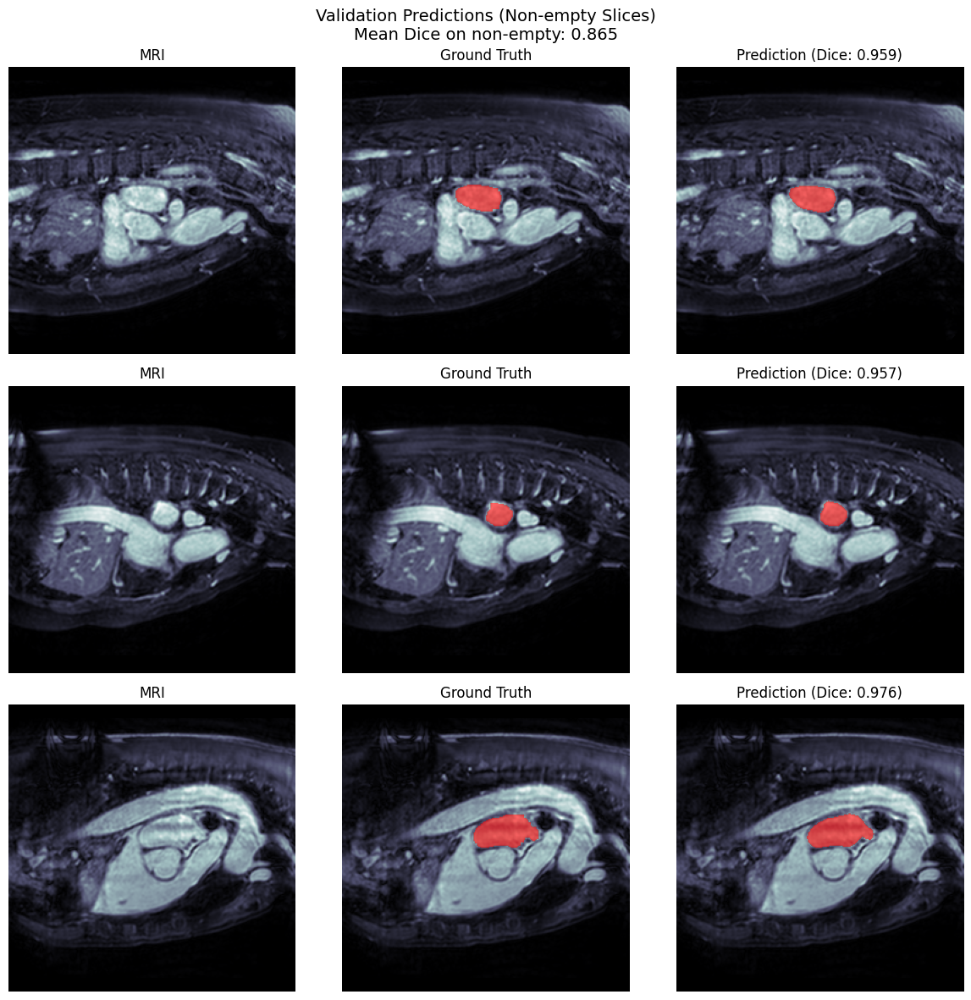

In [90]:
# =============================================================================
# Visualize predictions on validation samples (non-empty slices only)
# =============================================================================

fig, axes = plt.subplots(3, 3, figsize=(12, 12))

# Find non-empty samples
nonempty_indices = []
for idx in range(len(val_dataset)):
    _, mask = val_dataset[idx]
    if mask.sum() > 100:
        nonempty_indices.append(idx)

# Sample from non-empty
sample_indices = np.random.choice(nonempty_indices, size=3, replace=False)

for i, (ax_row, idx) in enumerate(zip(axes, sample_indices)):
    image, mask = val_dataset[idx]

    # Predict
    with torch.no_grad():
        image_tensor = torch.tensor(image).unsqueeze(0).to(device)
        pred = model_v2_loaded(image_tensor)[0, 0].cpu().numpy()
    pred_binary = (pred > 0.5).astype(float)

    # Per-sample Dice
    intersection = (pred_binary * mask[0]).sum()
    sample_dice = 2 * intersection / (pred_binary.sum() + mask[0].sum() + 1e-8)

    # Plot
    ax_row[0].imshow(image[0], cmap='bone')
    ax_row[0].set_title('MRI')
    ax_row[0].axis('off')

    ax_row[1].imshow(image[0], cmap='bone')
    mask_gt = np.ma.masked_where(mask[0] == 0, mask[0])
    ax_row[1].imshow(mask_gt, cmap='autumn', alpha=0.6)
    ax_row[1].set_title('Ground Truth')
    ax_row[1].axis('off')

    ax_row[2].imshow(image[0], cmap='bone')
    mask_pred = np.ma.masked_where(pred_binary == 0, pred_binary)
    ax_row[2].imshow(mask_pred, cmap='autumn', alpha=0.6)
    ax_row[2].set_title(f'Prediction (Dice: {sample_dice:.3f})')
    ax_row[2].axis('off')

plt.suptitle('Validation Predictions (Non-empty Slices)\nMean Dice on non-empty: 0.865', fontsize=14)
plt.tight_layout()
plt.savefig('validation_predictions.png', dpi=150, bbox_inches='tight')
plt.show()

## Visualize Full 3D Volume Prediction

Let's run inference on a complete test volume and create an animation.

In [91]:
# Load a test subject (from imagesTs if available, otherwise use a train subject)
test_dir = DATA_ROOT / "imagesTs"
if test_dir.exists():
    test_file = list(test_dir.glob("*.nii.gz"))[0]
else:
    test_file = list(IMAGES_DIR.glob("*.nii.gz"))[0]

print(f"Loading: {test_file.name}")

# Load and preprocess
test_mri = nib.load(test_file).get_fdata()
test_mri = test_mri[32:-32, 32:-32, :]  # Crop
test_mri = standardize(normalize(test_mri))

print(f"Shape: {test_mri.shape}")

Loading: la_012.nii.gz
Shape: (256, 256, 137)


In [92]:
# Predict on each slice
predictions = []

model_v2_loaded.eval()
with torch.no_grad():
    for i in range(test_mri.shape[2], desc="Predicting"):
        slice_2d = test_mri[:, :, i]
        slice_tensor = torch.tensor(slice_2d).unsqueeze(0).unsqueeze(0).float().to(device)
        pred = model_v2_loaded(slice_tensor)[0, 0].cpu().numpy()
        predictions.append(pred > 0.5)

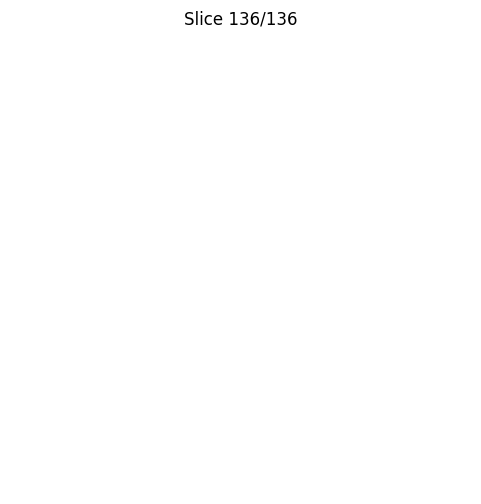

In [93]:
# =============================================================================
# 3D Visualization: Animation (for Colab) + Static (for GitHub)
# =============================================================================

# --- OPTION 1: Animation for Colab ---
from celluloid import Camera
from IPython.display import HTML

fig = plt.figure(figsize=(6, 6))
camera = Camera(fig)

for i in range(test_mri.shape[2]):
    plt.imshow(test_mri[:, :, i], cmap='bone')
    mask = np.ma.masked_where(predictions[i] == 0, predictions[i])
    plt.imshow(mask, alpha=0.5, cmap='autumn')
    plt.title(f'Slice {i}/{test_mri.shape[2]-1}')
    plt.axis('off')
    camera.snap()

animation = camera.animate(interval=100)
HTML(animation.to_html5_video())

Total slices: 137
Slices with predictions: 65
Max pixels in any slice: 1409

Middle slice raw output:
  Min: 0.0000
  Max: 1.0000
  Mean: 0.0202


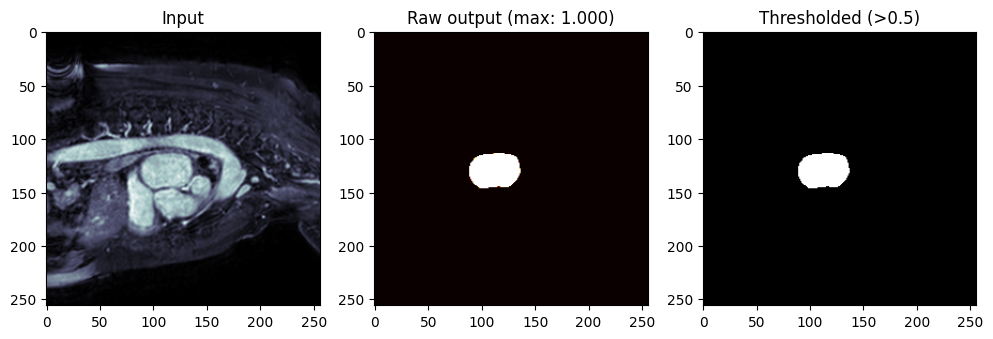

In [94]:
# Debug: check predictions
print(f"Total slices: {len(predictions)}")
print(f"Slices with predictions: {sum(p.sum() > 0 for p in predictions)}")
print(f"Max pixels in any slice: {max(p.sum() for p in predictions)}")

# Check raw model output (before thresholding)
model_v2_loaded.eval()
with torch.no_grad():
    mid_slice = test_mri.shape[2] // 2
    slice_tensor = torch.tensor(test_mri[:, :, mid_slice]).unsqueeze(0).unsqueeze(0).float().to(device)
    raw_pred = model_v2_loaded(slice_tensor)[0, 0].cpu().numpy()

print(f"\nMiddle slice raw output:")
print(f"  Min: {raw_pred.min():.4f}")
print(f"  Max: {raw_pred.max():.4f}")
print(f"  Mean: {raw_pred.mean():.4f}")

# Visualize raw prediction
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(test_mri[:, :, mid_slice], cmap='bone')
axes[0].set_title('Input')
axes[1].imshow(raw_pred, cmap='hot')
axes[1].set_title(f'Raw output (max: {raw_pred.max():.3f})')
axes[2].imshow(raw_pred > 0.5, cmap='gray')
axes[2].set_title('Thresholded (>0.5)')
plt.show()

Slices with atrium: 61 (indices 41-101)


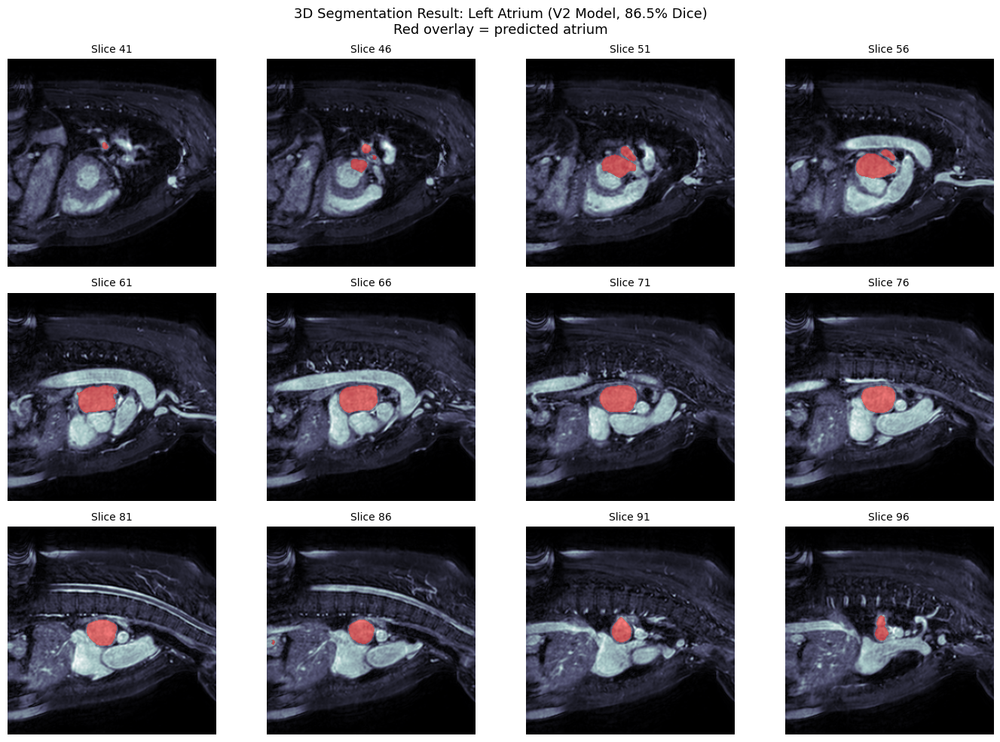

In [95]:
# --- Static montage for GitHub (sample from slices WITH atrium) ---

# Find slices that have predictions
slices_with_atrium = [i for i, p in enumerate(predictions) if p.sum() > 50]
print(f"Slices with atrium: {len(slices_with_atrium)} (indices {slices_with_atrium[0]}-{slices_with_atrium[-1]})")

# Sample evenly from those
n_show = min(12, len(slices_with_atrium))
step = max(1, len(slices_with_atrium) // n_show)
slice_indices = slices_with_atrium[::step][:12]

fig, axes = plt.subplots(3, 4, figsize=(14, 10))
axes = axes.flatten()

for ax, idx in zip(axes, slice_indices):
    ax.imshow(test_mri[:, :, idx], cmap='bone')
    mask = np.ma.masked_where(predictions[idx] == 0, predictions[idx])
    ax.imshow(mask, alpha=0.5, cmap='autumn')
    ax.set_title(f'Slice {idx}', fontsize=10)
    ax.axis('off')

plt.suptitle('3D Segmentation Result: Left Atrium (V2 Model, 86.5% Dice)\nRed overlay = predicted atrium', fontsize=13)
plt.tight_layout()
plt.savefig('3d_segmentation_montage.png', dpi=150, bbox_inches='tight')
plt.show()

---
# Summary

## What We Covered

| Topic | Key Points |
|-------|------------|
| **Data** | 3D NIfTI MRI → 2D slices, per-subject normalization |
| **Augmentation** | Albumentations: affine transforms + elastic deformation |
| **U-Net V1 → V2** | Added Dropout2d, weight decay, LR scheduler |
| **Dice Loss** | Handles class imbalance, but misleading on empty slices |

## Debugging Journey: Apparent Overtraining

| Step | Finding |
|------|---------|
| **1. Initial observation** | Train Dice 0.95, Val Dice 0.57 → 38-point gap |
| **2. Hypothesis** | Classic overtraining — model memorizing |
| **3. Intervention** | Added dropout, weight decay, LR scheduler, early stopping |
| **4. Result** | Gap unchanged — regularization wasn't the issue |
| **5. Root cause** | Stratified evaluation revealed metric artifact |
| **6. True performance** | **86.5% Dice** on atrium-containing slices, 4% failure rate |

**Key insight:** Reported val_dice was misleading due to empty slice handling. Always stratify metrics by clinically meaningful groups.

## Final Model Performance (V2 Regularized)

| Metric | Value |
|--------|-------|
| Non-empty slices (n=200) | **0.865 Dice** |
| Empty slices (n=139) | 95% accuracy |
| Failure rate | 4% (edge slices) |
| Epochs trained | 41 (early stopping) |

## Clinical Relevance

Left atrial segmentation is used for:
- Atrial fibrillation ablation planning
- LA volume measurement (cardiovascular risk factor)
- Pre-operative planning for cardiac procedures

## Engineering Lessons

1. **Stratify metrics** — overall Dice can be misleading with empty slices
2. **Visualize failures** — our 8 failures were edge cases, not model defects
3. **Regularization still valuable** — early stopping saved compute even when not the root cause
4. **Debug systematically** — the "obvious" diagnosis (overtraining) was wrong

## Next Steps

- **3D U-Net**: Process entire volume at once (avoids empty slice issue)
- **Loss functions**: Focal loss, combined Dice + BCE
- **Post-processing**: Connected component analysis
- **Uncertainty**: Monte Carlo dropout for prediction confidence

---